<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong>Analyse et prédictions des annulations des resrvations des hotels </strong>
</p>


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue" ; font-size:130% >Problème:</font></h3>

Dans ce projet, nous visons à construire un modèle prédictif pour déterminer si une réservation d'hôtel sera annulée, ce qui est crucial pour les hôtels car les annulations affectent les revenus et la planification opérationnelle. Le jeu de données contient un grand nombre de caractéristiques liées à la réservation, telles que le délai, le type de dépôt et les demandes spéciales, ce qui ajoute à la complexité du modèle. Le défi réside dans les étapes de prétraitement des données, qui comprennent la sélection et l'ingénierie des caractéristiques, la gestion des valeurs manquantes et le bruit dans les données. En outre, nous allons entraîner différents modèles, évaluer leurs performances en utilisant les bonnes mesures et interpréter le modèle en analysant les caractéristiques les plus importantes dans le contexte des annulations de réservations d'hôtel.


</div>


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue" ;font-size:130%>Objectifs :</font></h3> 

* __Étapes de Prétraitement__ :
  - Sélectionner et créer des caractéristiques
  - Gérer les valeurs manquantes
  - Traiter les données bruitées
  - Encoder les variables catégorielles
* __Exploration du Dataset__ : Examiner les informations de base du dataset, les statistiques résumées pour les variables numériques et catégorielles.
* __Construction du Modèle__ :
  - Implémenter et ajuster des modèles de classification, y compris la régression logistique, XGBoost, LightGBM, CatBoost, les arbres de décision et K-Nearest Neighbors (KNN).
  - Mettre l'accent sur l'atteinte d'un F1-score élevé pour la classe 1, en assurant une identification complète des annulations de réservations.
* __Évaluation et Comparaison des Performances des Modèles__ : Utiliser l'exactitude, la précision, le rappel et le F1-score pour évaluer l'efficacité des modèles.
* __Analyse de l'Importance des Caractéristiques__ : Comprendre quelles caractéristiques ont le plus d'influence sur les prédictions.

</div>


<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong> Data Cleaning </strong>
</p>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sidetable as stb
import warnings 
from sklearn.impute import SimpleImputer
pd.set_option('display.max_columns', None)

import datetime as dt
warnings.filterwarnings('ignore')

<a id='equilibre-classes'></a>
<p style="font-size: 30px; color: darkblue ; font-family: 'Comic Sans MS';">
    Basic Understanding of The Data
</p>


In [2]:

df = pd.read_csv('hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [4]:
df.isna().sum()
# Certaines colonnes contiennent des valeurs nulles dans le DataFrame. 
# Nous devrons les imputer et remplir certaines d'entre elles avec des valeurs aléatoires. 
# De plus, la colonne "company" contient une grande quantité de valeurs manquantes. 
# Il se pourrait qu'elle doive être supprimée, mais nous l'examinerons plus tard.


hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

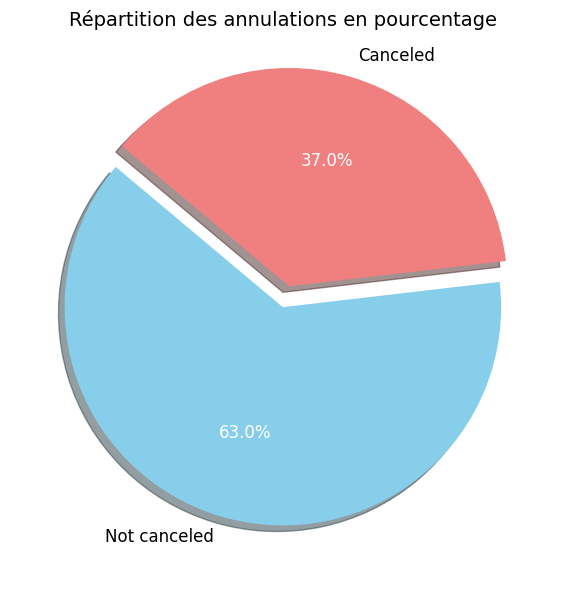

In [5]:
import matplotlib.pyplot as plt
import pandas as pd

# Compter les pourcentages d'annulations
counts = df['is_canceled'].value_counts(normalize=True) * 100

# Création d'un Pie Chart avec un effet 3D simulé
fig, ax = plt.subplots(figsize=(8, 6))
wedges, texts, autotexts = ax.pie(counts, labels=['Not canceled', 'Canceled'], autopct='%1.1f%%',
                                  colors=['skyblue', 'lightcoral'], explode=[0, 0.1], shadow=True, 
                                  startangle=140, textprops=dict(color="black"))

# Ajouter des propriétés aux labels
for text, autotext in zip(texts, autotexts):
    text.set_fontsize(12)
    autotext.set_fontsize(12)
    autotext.set_color('white')

# Ajouter un titre
plt.title("Répartition des annulations en pourcentage", fontsize=14)

# Afficher le graphique
plt.tight_layout()
plt.show()


<a id='equilibre-classes'></a>
<p style="font-size: 25px; color: darkblue; font-family: 'Comic Sans MS';">
    - Les proportions des classes pour la variable `is_canceled`sont : <br>
    - Classe 0 (non annulée) : <strong>63.0%</strong> <br>
    - Classe 1 (annulée) : <strong>37.0 %</strong> <br><br>
Ce déséquilibre n'est pas extrême, mais pourrait influencer les prédictions si le modèle privilégie la classe majoritaire (non annulée).
</p>


In [6]:
df['reservation_status'].value_counts()
# La colonne "reservation_status" devra être supprimée pour le machine learning, car elle contient le statut "canceled". 
# Cela pourrait, d'une certaine manière, divulguer des informations au modèle sur le statut final d'une réservation, 
# ce qui rendrait le modèle biaisé. 
# De plus, cette colonne ne serait pas utile pour prédire les annulations, 
# car le statut n'est défini qu'après l'annulation de la réservation ou après le départ du client de l'hôtel.


reservation_status
Check-Out    75166
Canceled     43017
No-Show       1207
Name: count, dtype: int64

In [7]:
df.describe()

# Il y a une valeur d'ADR (tarif journalier moyen) négative, nous allons faire une analyse plus approfondie à ce sujet, car il est impossible d'avoir un tarif journalier négatif pour un hôtel.
# Il y a également des enregistrements avec 0 adulte dans les données, nous allons également analyser cela plus en détail,
# car il est impossible d'avoir une réservation avec 0 adulte.
# Il y a aussi une valeur d'ADR anormalement élevée à 5400 euros (étant donné que c'est au Portugal, je suppose que c'est en euros).


,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [8]:
df.describe(include='O')

# Presque la moitié des réservations ont été faites depuis le Portugal.
# Dans ce cas, les hôtels urbains (city hotel) sont plus populaires (notamment à Lisbonne) comparés aux hôtels de type resort (région de l'Algarve).
# Il y a une différence entre le type de chambre réservé et le type de chambre attribué.
# L'hôtel pourrait disposer de chambres qui ne sont pas vendues au public.
# L'absence de dépôt pourrait expliquer pourquoi les annulations sont élevées (car le client n'a rien à perdre dans ce cas sans dépôt).
# Le type de chambre le plus populaire est le type A (nous devons vérifier cela avec l'ADR pour savoir quel type de chambre a le tarif journalier moyen le plus élevé et ce que cela a à voir avec la popularité).


,hotel,arrival_date_month,meal,country,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type,reservation_status,reservation_status_date
count,119390,119390,119390,118902,119390,119390,119390,119390,119390,119390,119390,119390
unique,2,12,5,177,8,5,10,12,3,4,3,926
top,City Hotel,August,BB,PRT,Online TA,TA/TO,A,A,No Deposit,Transient,Check-Out,2015-10-21
freq,79330,13877,92310,48590,56477,97870,85994,74053,104641,89613,75166,1461


<a id='equilibre-classes'></a>
<p style="font-size: 30px; color: darkblue; font-family: 'Comic Sans MS';">
    Dataset Explanation
</p>


In [9]:
# Création de la liste des descriptions en français
col_detail = [
    "Indique si les données proviennent de l'hôtel Resort (H1) ou City Hotel (H2).",
    "Valeur indiquant si la réservation a été annulée (1) ou non (0).",
    "Nombre de jours entre la date de réservation et la date d'arrivée.",
    "Année de la date d'arrivée.",
    "Mois de la date d'arrivée.",
    "Numéro de la semaine dans l'année pour la date d'arrivée.",
    "Jour de la date d'arrivée.",
    "Nombre de nuits de week-end (samedi ou dimanche) réservées ou passées à l'hôtel.",
    "Nombre de nuits en semaine (lundi à vendredi) réservées ou passées à l'hôtel.",
    "Nombre d'adultes.",
    "Nombre d'enfants.",
    "Nombre de bébés.",
    "Type de repas réservé : Undefined/SC – pas de repas; BB – Petit-déjeuner; HB – Demi-pension; FB – Pension complète.",
    "Pays d'origine (ISO 3166-1 alpha-3).",
    "Segment de marché : 'TA' signifie 'Agents de Voyage', 'TO' signifie 'Tour-Opérateurs'.",
    "Canal de distribution de la réservation : 'TA' signifie 'Agents de Voyage', 'TO' signifie 'Tour-Opérateurs'.",
    "Indique si le client est un client régulier (1) ou non (0).",
    "Nombre de réservations annulées précédemment par le client.",
    "Nombre de réservations précédentes non annulées par le client.",
    "Code du type de chambre réservée.",
    "Code du type de chambre attribuée (qui peut différer de celle réservée).",
    "Nombre de modifications apportées à la réservation.",
    "Indique si un acompte a été versé : No Deposit – aucun acompte; Non Refund – acompte total non remboursable; Refundable – acompte partiellement remboursable.",
    "ID de l'agence de voyage ayant effectué la réservation.",
    "ID de l'entreprise ou entité responsable du paiement de la réservation.",
    "Nombre de jours passés sur la liste d'attente avant confirmation.",
    "Type de réservation : Contrat, Groupe, Transient (réservation simple), ou Transient-party (réservation associée à d'autres).",
    "Taux journalier moyen (ADR), obtenu en divisant les transactions par le nombre total de nuits.",
    "Nombre de places de parking demandées par le client.",
    "Nombre de demandes spéciales formulées par le client (ex. : lit jumeau, étage élevé).",
    "Statut final de la réservation : Canceled – annulée, Check-Out – départ confirmé, No-Show – non-présent sans explication.",
    "Date à laquelle le dernier statut de réservation a été enregistré."
]

# Génération de la description des colonnes
df_descr = []
j = 0
for name in df.columns:
    df_descr.append(
        [
            name,
            df[name].dtypes,
            df[name].isnull().sum(),
            round(df[name].isnull().sum() / len(df) * 100, 2),
            df[name].nunique(),
            df[name].unique(),
            col_detail[j]  # Ajout de la description en français
        ]
    )
    j += 1

# Création du DataFrame descriptif
df_columns_desc = pd.DataFrame(df_descr, columns=['Nom de la colonne', 'Type de données', 'Valeurs manquantes', 
                                                  'Taux de valeurs manquantes (%)', 'Nombre de valeurs uniques', 
                                                  'Valeurs uniques', 'Description'])

# Affichage des résultats
print(f"Le jeu de données contient {len(df.columns)} colonnes.")


Le jeu de données contient 32 colonnes.


In [10]:
df_columns_desc

,Nom de la colonne,Type de données,Valeurs manquantes,Taux de valeurs manquantes (%),Nombre de valeurs uniques,Valeurs uniques,Description
0,hotel,object,0,0.00,2,"[Resort Hotel, City Hotel]",Indique si les données proviennent de l'hôtel ...
1,is_canceled,int64,0,0.00,2,"[0, 1]",Valeur indiquant si la réservation a été annul...
2,lead_time,int64,0,0.00,479,"[342, 737, 7, 13, 14, 0, 9, 85, 75, 23, 35, 68...",Nombre de jours entre la date de réservation e...
3,arrival_date_year,int64,0,0.00,3,"[2015, 2016, 2017]",Année de la date d'arrivée.
4,arrival_date_month,object,0,0.00,12,"[July, August, September, October, November, D...",Mois de la date d'arrivée.
5,arrival_date_week_number,int64,0,0.00,53,"[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 3...",Numéro de la semaine dans l'année pour la date...
6,arrival_date_day_of_month,int64,0,0.00,31,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",Jour de la date d'arrivée.
7,stays_in_weekend_nights,int64,0,0.00,17,"[0, 1, 2, 4, 3, 6, 13, 8, 5, 7, 12, 9, 16, 18,...",Nombre de nuits de week-end (samedi ou dimanch...
8,stays_in_week_nights,int64,0,0.00,35,"[0, 1, 2, 3, 4, 5, 10, 11, 8, 6, 7, 15, 9, 12,...",Nombre de nuits en semaine (lundi à vendredi) ...
9,adults,int64,0,0.00,14,"[2, 1, 3, 4, 40, 26, 50, 27, 55, 0, 20, 6, 5, 10]",Nombre d'adultes.


<a id='equilibre-classes'></a>
<p style="font-size: 30px; color: darkblue; font-family: 'Comic Sans MS';">
    Dataset Cleaning, Preparation and outliers Handling
</p>


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">
   Cleaning
</p>


In [11]:
df.isna().sum()


hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [12]:
# Remplissage des valeurs manquantes de la colonne "children" (enfants)
# Étant donné que la moyenne, la médiane et le mode des enfants sont égaux à 0, nous allons remplir ces valeurs manquantes avec 0.
# Nous allons utiliser la mode, car dans certains cas, la médiane ou la moyenne des valeurs peut être un nombre à virgule (float),
# et il n'est pas possible d'avoir un nombre à virgule pour le nombre d'enfants.
df['children'] = df['children'].fillna(0)
df.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               0
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [13]:
### Remplissage des valeurs manquantes de la colonne "country" (pays)
# Pour la colonne "country", nous allons la remplir avec la valeur la plus fréquente de la colonne,
# c'est-à-dire le mode, afin de garantir que la majorité des réservations appartiennent à un seul pays.

df['country'] = df['country'].fillna(df['country'].value_counts().index[0])
df.isna().sum()


hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               0
babies                                 0
meal                                   0
country                                0
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [14]:
## Étant donné qu'il y a 334 valeurs uniques dans la colonne "agent", remplir ces valeurs manquantes serait une démarche imprudente.
# De plus, dans la description, il est mentionné que de nombreuses valeurs nan dans la colonne "agent" correspondent à des réservations faites par des individus,
# donc il est préférable de supprimer cette colonne.
# Nous allons également supprimer la colonne "company", car elle contient plus de 90% de valeurs manquantes.

df = df.drop(columns=['agent', 'company'])
df.isna().sum()


hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

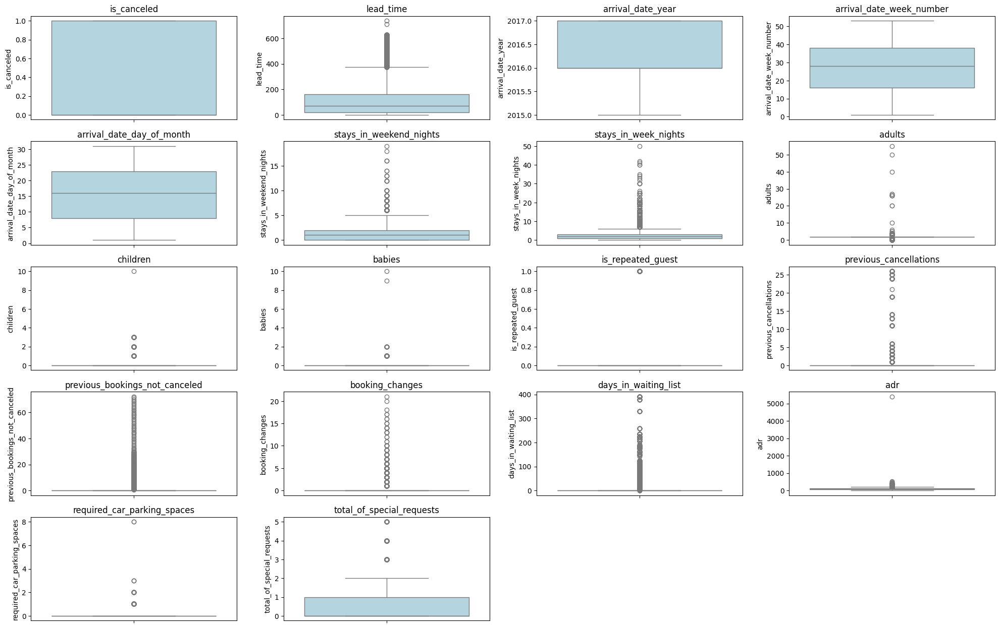

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Définir la taille de la figure
plt.figure(figsize=(20, 15))

# Création des boxplots pour chaque colonne numérique
for i, column in enumerate(df.describe().columns, 1):
    plt.subplot(6, 4, i)  # 6 lignes, 4 colonnes
    sns.boxplot(y=df[column], color='lightblue')  # Création du boxplot
    plt.title(f"{column}")  # Titre pour chaque graphique
# Pour les outliers spécifiques (comme les ADR supérieurs à 5000) :
# Nous pouvons utiliser un scatter plot pour visualiser les relations entre les variables

plt.tight_layout()  # Ajuste l'espacement entre les graphiques
plt.show()





In [16]:
# Puisqu'il est impossible d'avoir 0 adulte pour réserver une chambre d'hôtel

df.drop(labels = df[df['adults'] == 0].index, axis = 0, inplace = True)
df[df['adults'] == 0]


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


In [17]:
# Il y a une valeur dans la colonne adr qui est inférieure à 0, car il est impossible pour un hôtel de devoir de l'argent à un client
df[df['adr'] < 0]


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
14969,Resort Hotel,0,195,2017,March,10,5,4,6,2,0.0,0,BB,GBR,Groups,Direct,1,0,2,A,H,2,No Deposit,0,Transient-Party,-6.38,0,0,Check-Out,2017-03-15


In [18]:

df = df.drop(df[df.adr < 0].index)
df[df['adr'] < 0]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


In [19]:
df = df.drop(df[df.adr > 5000].index)
df[df['adr']> 5000]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">
   Preparation
</p>


In [20]:
## Conversion de la date d'arrivée de réservation en objet DateTime
df['arrival_date'] = df['arrival_date_year'].astype(str) + '-' + df['arrival_date_month'] + '-' + df['arrival_date_day_of_month'].astype(str)
df['arrival_date'] = pd.to_datetime(df['arrival_date'])
df.head()


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01


In [21]:
df['arrival_month'] = df['arrival_date'].dt.month
df.head()


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7


In [22]:
df['arrival_day'] = df['arrival_date'].dt.day_name()
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7,Wednesday


In [23]:

df['month_year'] = pd.to_datetime(df['arrival_date']).dt.to_period('M')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day,month_year
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7,Wednesday,2015-07


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">
<strong>Total Stays Column </strong><br>
obtenir la colonne des séjours totaux en additionnant les séjours des jours de semaine et les séjours des week-ends</p>


In [24]:
df['total_stays'] = df['stays_in_weekend_nights'] + df['stays_in_week_nights']
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day,month_year,total_stays
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7,Wednesday,2015-07,2


In [25]:
df[df['total_stays'] == 0]

# this is a little randomness of the data as well since you won't be able to make a booking at the arrival date and checkout on 
# the same day

# many OTA (booking.com, traveloka won't allow you to do this however hilton hotel allow you to do this )
# so we will keep the data instead of dropping it 


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day,month_year,total_stays
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0
167,Resort Hotel,0,111,2015,July,28,6,0,0,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,H,0,No Deposit,0,Transient,0.0,0,2,Check-Out,2015-07-06,2015-07-06,7,Monday,2015-07,0
168,Resort Hotel,0,0,2015,July,28,6,0,0,1,0.0,0,BB,PRT,Direct,Direct,0,0,0,E,H,0,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-06,2015-07-06,7,Monday,2015-07,0
196,Resort Hotel,0,8,2015,July,28,7,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,A,A,0,No Deposit,0,Transient,0.0,0,1,Check-Out,2015-07-07,2015-07-07,7,Tuesday,2015-07,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115483,City Hotel,0,15,2017,July,27,6,0,0,1,0.0,0,SC,FRA,Direct,Direct,0,0,0,A,A,0,No Deposit,0,Transient-Party,0.0,0,0,Check-Out,2017-07-06,2017-07-06,7,Thursday,2017-07,0
117701,City Hotel,0,0,2017,August,32,8,0,0,2,0.0,0,BB,PRT,Offline TA/TO,TA/TO,1,0,0,A,A,0,No Deposit,0,Transient,0.0,0,0,Check-Out,2017-08-08,2017-08-08,8,Tuesday,2017-08,0
118029,City Hotel,0,0,2017,August,33,14,0,0,2,0.0,0,BB,PRT,Direct,Direct,1,0,0,A,A,0,No Deposit,0,Transient,0.0,0,0,Check-Out,2017-08-14,2017-08-14,8,Monday,2017-08,0
118631,City Hotel,0,78,2017,August,34,23,0,0,1,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,K,7,No Deposit,0,Transient-Party,0.0,0,0,Check-Out,2017-08-23,2017-08-23,8,Wednesday,2017-08,0


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">
<strong>Références pour montrer qu'il est possible de réserver et de quitter l'hôtel le même jour</strong><br>
    
En regardant l'image ci-dessous, il est possible de réserver un hôtel le même jour que le départ (pas un séjour d'une nuit au Portugal) en se basant sur l'hôtel Hilton, donc nous ne laisserons pas tomber les rangées qui ont 0 séjour total (pas une nuit).
    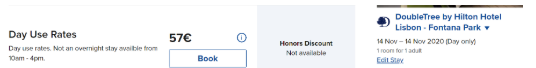
</p>


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">
<strong>Invités, enfants et enfants</strong><br>
Nous voulons voir le nombre total d'invités de la réservation en combinant la valeur des adultes, des enfants et des bébés et en ajoutant les enfants dans la réservation en combinant les enfants et les bébés, parce que la plupart des sites de réservation n'ont pas d'option pour les bébés.
</p>


In [26]:
df['guests'] = df['adults'] + df['children'] + df['babies']
df.head()

# Total des invités pour la réservation d'hôtel en ajoutant les adultes, les enfants et les bébés


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day,month_year,total_stays,guests
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0,2.0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0,2.0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7,Wednesday,2015-07,2,2.0


In [27]:
df['kids'] = df['children'] + df['babies']
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day,month_year,total_stays,guests,kids
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0,2.0,0.0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0,2.0,0.0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1,1.0,0.0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1,1.0,0.0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7,Wednesday,2015-07,2,2.0,0.0


In [28]:
df['meal'].unique()

# Nous pouvons observer qu'il y a une valeur "undefined" dans le jeu de données.
# Cependant, selon les explications fournies par la source du jeu de données, le package de repas "undefined" est équivalent à SC (Aucun repas).
# Nous allons donc remplacer la valeur "undefined" par SC.


array(['BB', 'FB', 'HB', 'SC', 'Undefined'], dtype=object)

In [29]:
df['meal'] = df['meal'].str.replace('Undefined', 'SC')
df['meal'].unique()

array(['BB', 'FB', 'HB', 'SC'], dtype=object)

In [30]:
# vérifions maintenant la description de toutes les colonnes et le diagramme en boîte de toutes les colonnes avant de passer à l'analyse exploratoire des données

df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,arrival_date,arrival_month,total_stays,guests,kids
count,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985,118985.000000,118985.000000,118985.000000,118985.000000
mean,0.370753,104.070353,2016.156356,27.164407,15.796781,0.926932,2.499029,1.862689,0.100433,0.007951,0.031542,0.087339,0.137328,0.218507,2.325604,101.964460,0.062655,0.570652,2016-08-28 14:48:28.985165824,6.552381,3.425961,1.971072,0.108383
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015-07-01 00:00:00,1.000000,0.000000,1.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.500000,0.000000,0.000000,2016-03-13 00:00:00,4.000000,2.000000,2.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,95.000000,0.000000,0.000000,2016-09-06 00:00:00,7.000000,3.000000,2.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000,2017-03-19 00:00:00,9.000000,4.000000,2.000000,0.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,18.000000,391.000000,510.000000,8.000000,5.000000,2017-08-31 00:00:00,12.000000,69.000000,55.000000,10.000000
std,0.483008,106.891161,0.707743,13.598771,8.781164,0.995235,1.897747,0.570064,0.390219,0.097474,0.174777,0.845700,1.499529,0.638068,17.614343,48.053329,0.245546,0.792403,NaN,3.089348,2.541649,0.719446,0.404480


<a id='equilibre-classes'></a>
<p style="font-size: 25px; color: darkblue; font-family: 'Comic Sans MS';">
    Dropping Redundant Column
</p>


In [31]:
# Puisque nous avons des colonnes qui ont des valeurs presque similaires comme 'children' et 'babies', nous les avons combinées en une seule colonne 'kids'.
# Les colonnes 'stays_in_weekend_nights' et 'stays_in_week_nights' ont aussi été combinées en une seule colonne 'total_stays'.
# Nous allons maintenant supprimer ces colonnes.

df = df.drop(columns = ['stays_in_weekend_nights', 'stays_in_week_nights', 'babies', 'children'])
df.head()


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,adults,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,arrival_month,arrival_day,month_year,total_stays,guests,kids
0,Resort Hotel,0,342,2015,July,27,1,2,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0,2.0,0.0
1,Resort Hotel,0,737,2015,July,27,1,2,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,7,Wednesday,2015-07,0,2.0,0.0
2,Resort Hotel,0,7,2015,July,27,1,1,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1,1.0,0.0
3,Resort Hotel,0,13,2015,July,27,1,1,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,7,Wednesday,2015-07,1,1.0,0.0
4,Resort Hotel,0,14,2015,July,27,1,2,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,7,Wednesday,2015-07,2,2.0,0.0


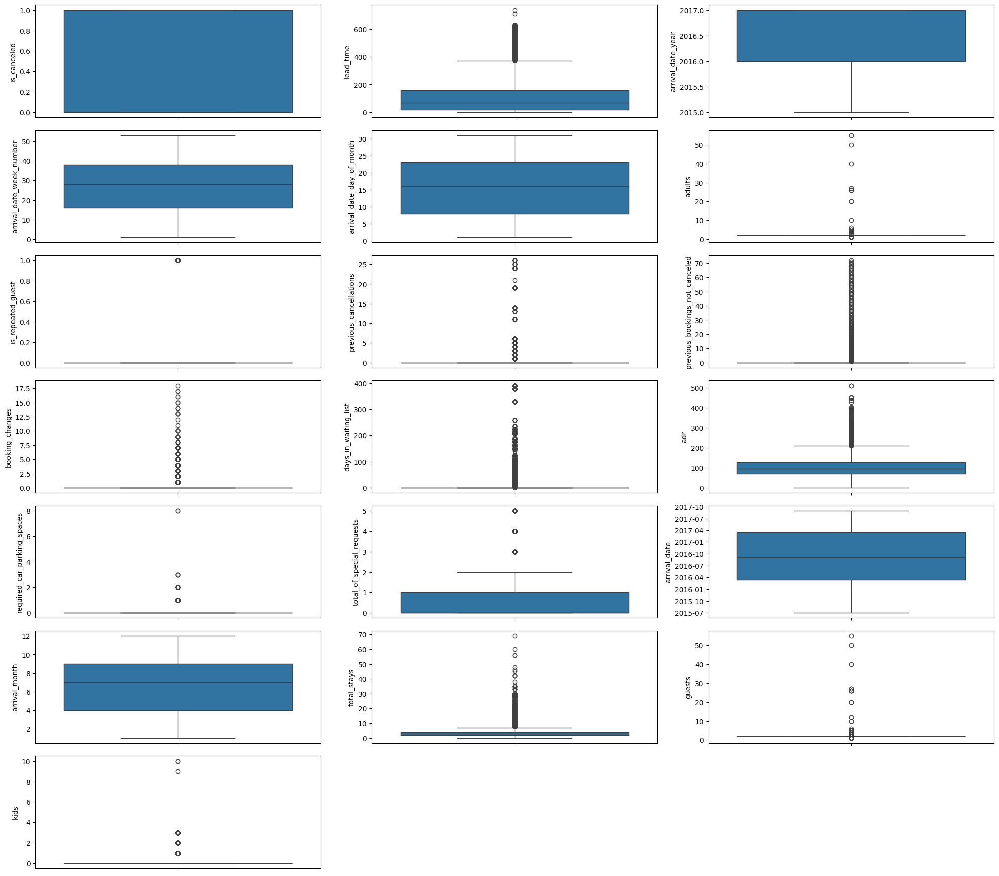

In [32]:
plt.figure(figsize = (20, 20))
x = 1 

# Pour chaque colonne numérique du DataFrame, nous traçons un boxplot pour détecter les outliers
for column in df.describe().columns:
    plt.subplot(8, 3, x)  # Crée une grille de sous-graphes pour afficher plusieurs boxplots
    sns.boxplot(df[column])  # Tracer un boxplot pour chaque colonne
    x += 1  # Incrémenter le numéro du sous-graphe

plt.tight_layout()  # Ajuste l'espacement entre les sous-graphes pour éviter que les labels se chevauchent

# Comme nous pouvons le voir, il y a encore de nombreux outliers dans plusieurs colonnes.
# Nous ne allons pas supprimer les outliers ici, car ces derniers peuvent fournir des informations utiles.
# Nous allons plutôt les "biner" (regrouper) et créer de nouvelles colonnes.
# Nous espérons que cette opération nous permettra d'extraire davantage d'informations intéressantes à partir de ces données.


In [33]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,adults,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,arrival_date,arrival_month,total_stays,guests,kids
count,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985.000000,118985,118985.000000,118985.000000,118985.000000,118985.000000
mean,0.370753,104.070353,2016.156356,27.164407,15.796781,1.862689,0.031542,0.087339,0.137328,0.218507,2.325604,101.964460,0.062655,0.570652,2016-08-28 14:48:28.985165824,6.552381,3.425961,1.971072,0.108383
min,0.000000,0.000000,2015.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015-07-01 00:00:00,1.000000,0.000000,1.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.500000,0.000000,0.000000,2016-03-13 00:00:00,4.000000,2.000000,2.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,95.000000,0.000000,0.000000,2016-09-06 00:00:00,7.000000,3.000000,2.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000,2017-03-19 00:00:00,9.000000,4.000000,2.000000,0.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,55.000000,1.000000,26.000000,72.000000,18.000000,391.000000,510.000000,8.000000,5.000000,2017-08-31 00:00:00,12.000000,69.000000,55.000000,10.000000
std,0.483008,106.891161,0.707743,13.598771,8.781164,0.570064,0.174777,0.845700,1.499529,0.638068,17.614343,48.053329,0.245546,0.792403,NaN,3.089348,2.541649,0.719446,0.404480


In [34]:

df.describe(include = 'O').T

,count,unique,top,freq
hotel,118985,2,City Hotel,78939
arrival_date_month,118985,12,August,13829
meal,118985,4,BB,92018
country,118985,177,PRT,48917
market_segment,118985,8,Online TA,56221
distribution_channel,118985,5,TA/TO,97559
reserved_room_type,118985,9,A,85861
assigned_room_type,118985,11,A,73982
deposit_type,118985,3,No Deposit,104237
customer_type,118985,4,Transient,89336


In [35]:
# Puisque les données ont été nettoyées, qu'il n'y a plus de valeurs manquantes et que nous avons traité certaines anomalies dans les données,
# nous allons maintenant exporter ce DataFrame propre afin de pouvoir effectuer une analyse exploratoire des données (EDA) dessus.

df_cleaned = df.dropna()  # Crée un nouveau DataFrame au lieu d'écraser 'df'
df_cleaned.to_csv('hotel_cleaned.csv', index=False)


<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong>Exploratry Data Analysis (EDA) </strong>
</p>


<a id='equilibre-classes'></a>
<p style="font-size: 25px; color: darkblue; font-family: 'Comic Sans MS';">
    Univariate Analysis<br></p>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">Hotel Type
</p>


In [36]:
# Utilisation de la fonction 'freq' de la bibliothèque 'stb' pour calculer la fréquence des valeurs dans la colonne 'hotel'.
# Ici, nous analysons les réservations en fonction du type d'hôtel (city hotel ou resort hotel).
df_cleaned.stb.freq(['hotel'], cum_cols=False)

# Comme mentionné précédemment, il y a plus de réservations pour les hôtels urbains (city hotel) par rapport aux hôtels de station (resort hotel).
# Nous allons examiner plus tard comment cela affecte les annulations.


,hotel,count,percent
0,City Hotel,78939,66.343657
1,Resort Hotel,40046,33.656343


<a id='equilibre-classes'></a>

<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">Cancellation
</p>


In [37]:
# Utilisation de la fonction 'freq' de la bibliothèque 'stb' pour calculer la fréquence des valeurs dans la colonne 'is_canceled'.
# Ici, nous analysons le taux d'annulation des réservations.
df_cleaned.stb.freq(['is_canceled'], cum_cols=False)
# Ces données sont presque équilibrées, donc plus tard, lors du processus de machine learning, 
# nous n'aurons pas besoin de traiter un déséquilibre des classes.


,is_canceled,count,percent
0,0,74871,62.924738
1,1,44114,37.075262


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"><strong>Lead Time </strong><br> 
Comme il y a beaucoup de valeurs uniques dans le délai d'exécution, nous allons le regrouper en mois avant d'effectuer une analyse sur ces valeurs. Nous espérons ainsi pouvoir dégager une tendance en regroupant lead_time en mois.
</p>


In [38]:
# Création d'une nouvelle colonne 'lead_time_month' en calculant le nombre de mois avant l'arrivée en divisant 'lead_time' par 30
lead_time_months = df_cleaned['lead_time'] // 30
lead_time_months.value_counts() / len(df)

# Ajout de la colonne 'lead_time_month' dans le DataFrame
df_cleaned['lead_time_month'] = df_cleaned['lead_time'] // 30

# Nous pouvons observer que la majorité des réservations ont été effectuées pendant le même mois que l'arrivée prévue.
# Cependant, il y a certaines réservations faites un an ou plus à l'avance avant l'arrivée.
# Nous analyserons comment cette période de lead time plus longue affecte le taux d'annulation.


In [39]:
df_cleaned.stb.freq(['lead_time_month'], cum_cols = False)


,lead_time_month,count,percent
0,0,37879,31.835105
1,1,17140,14.405177
2,2,12697,10.671093
3,3,10453,8.785141
4,4,8046,6.762197
5,5,7891,6.631928
6,6,5699,4.789679
7,7,4354,3.659285
8,9,3441,2.891961
9,8,3420,2.874312


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> Distribution channel <br> 

</p>


In [40]:
df_cleaned.stb.freq(['distribution_channel'], cum_cols=False)

# Comme on peut le voir dans le tableau ci-dessous, l'Agent de Voyage ou l'Opérateur Touristique (Travel Agent / Tour Operator)
# est le plus grand canal de distribution des réservations, comparé aux autres canaux,
# tandis que le canal direct (Direct) est le deuxième plus grand canal de distribution.

# Nous allons traiter les valeurs non définies (undefined) comme étant des agents de voyages ou opérateurs touristiques (TA / TO).


,distribution_channel,count,percent
0,TA/TO,97559,81.992688
1,Direct,14577,12.251124
2,Corporate,6651,5.589780
3,GDS,193,0.162205
4,Undefined,5,0.004202


In [41]:
df_cleaned['distribution_channel'] =  df_cleaned['distribution_channel'].str.replace('Undefined', 'TA/TO')
df_cleaned.stb.freq(['distribution_channel'], cum_cols= False)


,distribution_channel,count,percent
0,TA/TO,97564,81.996890
1,Direct,14577,12.251124
2,Corporate,6651,5.589780
3,GDS,193,0.162205


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> Market Segment <br> 
</p>


In [42]:
# Affichage de la fréquence des valeurs de la colonne 'market_segment'
df_cleaned.stb.freq(['market_segment'], cum_cols = False)

# Le segment de marché est similaire au canal de distribution,
# cependant, nous remarquons qu'il y a plus de catégories dans cette colonne par rapport à la colonne du canal de distribution.
# On observe ici que le segment de marché "Travel Agent" (en ligne et hors ligne) domine les réservations par rapport aux autres segments de marché.

# Il y a également quelques valeurs "undefined" dans cette colonne. 
# Nous allons remplacer ces valeurs "undefined" par la valeur la plus fréquente dans la colonne, qui est "Online TA".
# Cela consiste à imputer une valeur manquante ou "aléatoire" avec la valeur la plus courante dans la colonne, ce qui permet de conserver la cohérence des données.


,market_segment,count,percent
0,Online TA,56221,47.250494
1,Offline TA/TO,24178,20.320208
2,Groups,19790,16.632349
3,Direct,12553,10.550069
4,Corporate,5282,4.439215
5,Complementary,724,0.608480
6,Aviation,235,0.197504
7,Undefined,2,0.001681


In [43]:

df_cleaned['market_segment'] = df_cleaned['market_segment'].replace('Undefined', 'Online TA')
df_cleaned.stb.freq(['market_segment'], cum_cols = False)

,market_segment,count,percent
0,Online TA,56223,47.252175
1,Offline TA/TO,24178,20.320208
2,Groups,19790,16.632349
3,Direct,12553,10.550069
4,Corporate,5282,4.439215
5,Complementary,724,0.608480
6,Aviation,235,0.197504


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color:darkblue; font-family: 'Comic Sans MS';"> Meal Type 
</p>


In [44]:
# Affichage de la fréquence des valeurs de la colonne 'meal'
df_cleaned.stb.freq(['meal'], cum_cols=False)

# Le forfait 'Bed and Breakfast' (petit-déjeuner compris) est le forfait de repas le plus populaire par rapport aux autres forfaits de repas.
# Tandis que le forfait 'Full Board' (pension complète, incluant petit-déjeuner, déjeuner et dîner) est le forfait le moins populaire comparé aux autres forfaits de repas.


,meal,count,percent
0,BB,92018,77.335799
1,HB,14454,12.147750
2,SC,11715,9.845779
3,FB,798,0.670673


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> Contry
</p>


In [45]:
# Affichage des 10 premières fréquences des valeurs dans la colonne 'country'
df_cleaned.stb.freq(['country'], cum_cols = False).head(10)

# Presque la moitié des réservations provient du Portugal (ce qui est logique puisque les deux hôtels sont situés au Portugal).

# Étant donné qu'il y a beaucoup de valeurs uniques représentant les pays d'origine des réservations, 
# nous allons essayer de regrouper ces pays par continent ou bien de les diviser en réservations locales (Portugal) 
# et internationales (tous les autres pays). Cela a du sens étant donné que les deux hôtels sont situés au Portugal,
# donc une distinction entre réservations locales et internationales semble appropriée.


,country,count,percent
0,PRT,48917,41.111905
1,GBR,12104,10.172711
2,FRA,10376,8.720427
3,ESP,8546,7.182418
4,DEU,7271,6.110854
5,ITA,3752,3.153339
6,IRL,3370,2.832290
7,BEL,2326,1.954868
8,BRA,2212,1.859058
9,NLD,2094,1.759886


In [46]:
def country(row):
    if (row['country'] == 'PRT'):
        return 'Local'
    else :
        return 'International'
    
df_cleaned['booking_location'] = df_cleaned.apply(country, axis = 1)

df_cleaned.stb.freq(['booking_location'], cum_cols=False)


,booking_location,count,percent
0,International,70068,58.888095
1,Local,48917,41.111905


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> Reserved Room Type
</p>


In [47]:
# Affichage de la fréquence des valeurs de la colonne 'reserved_room_type' (type de chambre réservée)
df_cleaned.stb.freq(['reserved_room_type'], cum_cols=False)

# Comme nous l'avons vu dans le résumé de notre DataFrame avec df.describe(include='O'), 
# la chambre de type 'A' est la plus populaire dans les réservations.
# Nous allons analyser plus tard pourquoi, mais notre hypothèse pour l'instant est que la chambre A 
# est la chambre la moins chère par rapport aux autres types de chambres.


,reserved_room_type,count,percent
0,A,85861,72.161197
1,D,19178,16.117998
2,E,6518,5.478001
3,F,2892,2.430558
4,G,2091,1.757364
5,C,931,0.782452
6,B,907,0.762281
7,H,601,0.505106
8,L,6,0.005043


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> Deposit Type
</p>


In [48]:
# Affichage de la fréquence des valeurs de la colonne 'deposit_type' (type de dépôt)
df_cleaned.stb.freq(['deposit_type'], cum_cols=False)

# Comme mentionné précédemment, le type de dépôt 'Aucun dépôt' est le plus populaire par rapport aux autres types de dépôt dans ces réservations au Portugal.
# Cela pourrait être une des raisons pour lesquelles le taux d'annulation dans l'industrie est en hausse.
# La flexibilité accordée au client de réserver un hôtel sans avoir à verser de dépôt pourrait en être la cause.


,deposit_type,count,percent
0,No Deposit,104237,87.605160
1,Non Refund,14586,12.258688
2,Refundable,162,0.136152


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> Repeated Guest
</p>


In [49]:
# Affichage de la fréquence des valeurs de la colonne 'is_repeated_guest' (invité récurrent)
df_cleaned.stb.freq(['is_repeated_guest'], cum_cols=False)

# D'après le tableau ci-dessous, nous voyons qu'il n'y a que 3,1 % d'invités récurrents parmi ces réservations.
# Cela pourrait affecter le taux d'annulation de l'hôtel, car le faible taux de clients fidèles pourrait être une des raisons.
# Nous allons approfondir cette question plus tard.

# Nous ne nous concentrerons pas uniquement sur les clients fidèles, mais voici quelques raisons pour lesquelles les clients fidèles sont plus rentables que les nouveaux :
# 1. Ils connaissent déjà la valeur de votre service.
# 2. Leur coût de service est plus bas.
# 3. Ils recommandent plus de clients.
# 4. Ils achètent et paient davantage.



,is_repeated_guest,count,percent
0,0,115232,96.845821
1,1,3753,3.154179


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> previous Cancellation
</p>


In [50]:
df_cleaned.stb.freq(['previous_cancellations'], cum_cols = False)

# Près de 95% des réservations n'ont jamais été annulées auparavant dans cet ensemble de données
# Nous allons regrouper ces réservations en réservations qui n'ont jamais été annulées


,previous_cancellations,count,percent
0,0,112508,94.556457
1,1,6046,5.081313
2,2,114,0.095810
3,3,65,0.054629
4,24,48,0.040341
5,11,35,0.029415
6,4,31,0.026054
7,26,26,0.021851
8,25,25,0.021011
9,6,22,0.018490


In [51]:
def cancellation(row):
    if (row['previous_cancellations'] == 0):
        return 0
    else :
        return 1

df_cleaned['is_previously_cancelled'] = df_cleaned.apply(cancellation, axis = 1)
df_cleaned.stb.freq(['is_previously_cancelled'], cum_cols = False)

,is_previously_cancelled,count,percent
0,0,112508,94.556457
1,1,6477,5.443543


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color:darkblue; font-family: 'Comic Sans MS';"> 
Booking Changes
</p>


In [52]:
df_cleaned.stb.freq(['booking_changes'], cum_cols = False)

# Près de 85 % des clients n'ont jamais modifié leur réservation
# Étant donné qu'il y a de nombreuses valeurs dans cette colonne des modifications de réservation,
# nous allons la regrouper en deux catégories : les réservations qui ont été modifiées ou non


,booking_changes,count,percent
0,0,101066,84.940119
1,1,12620,10.606379
2,2,3773,3.170988
3,3,910,0.764802
4,4,367,0.308442
5,5,114,0.095810
6,6,61,0.051267
7,7,28,0.023532
8,8,14,0.011766
9,9,8,0.006724


In [53]:
def changes(row):
    if (row['booking_changes'] == 0):
        return 0
    else :
        return 1

df_cleaned['is_booking_changes'] = df_cleaned.apply(changes, axis = 1)
df_cleaned.stb.freq(['is_booking_changes'], cum_cols = False)

,is_booking_changes,count,percent
0,0,101066,84.940119
1,1,17919,15.059881


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
Special Request
</p>


In [54]:
df_cleaned.stb.freq(['total_of_special_requests'], cum_cols = False)

# Plus de la moitié des clients n'ont aucune demande spéciale lors de leur réservation
# Nous verrons plus tard si les demandes spéciales ont un effet sur le taux d'annulation


,total_of_special_requests,count,percent
0,0,70131,58.941043
1,1,33085,27.806026
2,2,12911,10.850948
3,3,2480,2.084296
4,4,338,0.284069
5,5,40,0.033618


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
Customer Type
</p>


In [55]:
df_cleaned.stb.freq(['customer_type'], cum_cols = False)

# La majorité des clients ayant effectué une réservation sont des clients "transients" (réservations individuelles/personnelles non liées à une entreprise ou à autre chose)
# Nous verrons comment ce type de client affecte également le taux d'annulation


,customer_type,count,percent
0,Transient,89336,75.081733
1,Transient-Party,25005,21.015254
2,Contract,4071,3.421440
3,Group,573,0.481573


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
Arrival Date Month
</p>


In [56]:
df_cleaned.stb.freq(['arrival_date_month'], cum_cols = False)

# Juillet et août apparaissent 3 fois,
# tandis que le reste des mois de l'année n'apparaît que deux fois,
# car ces données couvrent la période de juillet 2015 à août 2017.

# Utiliser le pourcentage ici ne serait pas très fiable, car certains mois apparaissent plus fréquemment que d'autres.


,arrival_date_month,count,percent
0,August,13829,11.622473
1,July,12611,10.598815
2,May,11764,9.886961
3,October,11131,9.354961
4,April,11057,9.292768
5,June,10917,9.175106
6,September,10489,8.815397
7,March,9749,8.193470
8,February,8034,6.752112
9,November,6765,5.685591


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
Arrival Day
</p>


In [57]:
df_cleaned.stb.freq(['arrival_day'], cum_cols=False)

# Nous voyons ici que les réservations pour un jour d'arrivée le vendredi et le jeudi ont le pourcentage le plus élevé parmi tous les autres jours.
# Tandis que les réservations pour un jour d'arrivée le dimanche et le mardi ont le pourcentage le plus faible.
# Nous allons essayer d'examiner cela en fonction du nombre d'annulations.


,arrival_day,count,percent
0,Friday,19556,16.435685
1,Thursday,19187,16.125562
2,Monday,18127,15.234693
3,Saturday,18002,15.129638
4,Wednesday,16074,13.509266
5,Sunday,14090,11.841829
6,Tuesday,13949,11.723326


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>Analyse multivariée</strong><br>
Puisque notre objectif est de découvrir ce qui conduit à un taux d'annulation élevé en examinant les caractéristiques du client et le modèle de réservation annulée, notre analyse multivariée sera centrée sur ce processus.
</p>


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>Hotel Type and Cancellation</strong><br>

</p>


In [58]:
# Taux d'annulation normalisé par type d'hôtel
taux_annulation = pd.crosstab(df['hotel'], df_cleaned['is_canceled'], normalize='index')
print("Taux d'annulation par type d'hôtel :")
display(taux_annulation)

# Fréquence des réservations par type d'hôtel
frequence_reservations = df_cleaned.stb.freq(['hotel'], cum_cols=False)
print("Fréquence des réservations par type d'hôtel :")
display(frequence_reservations)

# Comparaison côte à côte avec description claire
print("Analyse comparative des annulations et du nombre de réservations :\n")

# Combiner les deux tableaux dans un seul DataFrame pour faciliter l'analyse
analyse_combinee = taux_annulation.rename(columns={0: 'Not canceled', 1: 'Canceled'})
analyse_combinee['Nombre de réservations'] = frequence_reservations['count'].values
analyse_combinee['Pourcentage'] = frequence_reservations['percent'].values

# Afficher le tableau combiné
print("Analyse combinée :")
display(analyse_combinee)


Taux d'annulation par type d'hôtel :


is_canceled,0,1
hotel,,
City Hotel,0.582032,0.417968
Resort Hotel,0.722319,0.277681


Fréquence des réservations par type d'hôtel :


,hotel,count,percent
0,City Hotel,78939,66.343657
1,Resort Hotel,40046,33.656343


Analyse comparative des annulations et du nombre de réservations :

Analyse combinée :


is_canceled,Not canceled,Canceled,Nombre de réservations,Pourcentage
hotel,,,,
City Hotel,0.582032,0.417968,78939,66.343657
Resort Hotel,0.722319,0.277681,40046,33.656343


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>Lead time  and Cancellation</strong><br>

</p>


In [59]:
pd.crosstab(df_cleaned['lead_time_month'], df_cleaned['is_canceled'], normalize = 'index')

# D'après le crosstab ci-dessous, nous voyons que le délai de réservation (lead time) a généralement un effet linéaire sur l'annulation
# Cela signifie qu'en général, un délai de réservation plus long est associé à un taux d'annulation plus élevé par rapport à un délai plus court.

# Les réservations ayant un délai de réservation de plus de 7 mois sont plus susceptibles d'être annulées par rapport à celles qui sont confirmées.


is_canceled,0,1
lead_time_month,,
0,0.817498,0.182502
1,0.636173,0.363827
2,0.602189,0.397811
3,0.558978,0.441022
4,0.563510,0.436490
5,0.538081,0.461919
6,0.551851,0.448149
7,0.531465,0.468535
8,0.448830,0.551170


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>Arrival Date year and Cancellation</strong><br>

</p>


In [60]:
pd.crosstab(df_cleaned['arrival_date_year'], df_cleaned['is_canceled'], normalize = 'index')

# Le taux d'annulation diminue d'environ 1,2 % en 2016
# Cependant, le taux d'annulation augmente de 1,9 % en 2017 pour atteindre 38,7 %.

# Cependant, les années 2015 et 2017 n'ont que la moitié de l'année, donc ce résultat peut ne pas représenter l'annulation réelle pour ces années.


is_canceled,0,1
arrival_date_year,,
2015,0.629373,0.370627
2016,0.641004,0.358996
2017,0.612807,0.387193


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Arrival Date Month and Cancellation</strong><br>
Dans ce tableau croisé, nous voulons voir s'il y a un mois spécifique qui a un taux d'annulation plus élevé que le reste du mois ou si le mois n'a pas d'effet sur l'annulation.

</p>


In [61]:
pd.crosstab(df_cleaned['arrival_date_month'], df_cleaned['is_canceled'], normalize = 'index').sort_values(1, ascending = False)

# Il y a une fluctuation évidente en termes de mois d'arrivée et d'annulation.
# Les mois avec les taux d'annulation les plus élevés sont :
# 1. Juin (41,5 %)
# 2. Avril (40,8 %)
# 3. Mai (39,6 %)

# Ces 3 mois combinés comptent un total de 18 jours fériés et d'observances en 2017,
# 15 jours en 2016,
# 14 jours en 2015.

# De plus, juin est un mois de vacances scolaires au Portugal.

# Cela pourrait être la raison pour laquelle, pendant ces mois, le taux d'annulation est plus élevé par rapport aux autres mois.


is_canceled,0,1
arrival_date_month,,
June,0.584959,0.415041
April,0.592114,0.407886
May,0.603111,0.396889
September,0.608352,0.391648
October,0.618722,0.381278
August,0.622098,0.377902
July,0.625169,0.374831
December,0.649792,0.350208
February,0.665546,0.334454


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Number of Adults, kids, Total & guest Cancellation</strong><br>


</p>


In [62]:
# Affichage du crosstab pour la relation entre le nombre d'adultes et le taux d'annulation
pd.crosstab(df_cleaned['adults'], df_cleaned['is_canceled'], normalize='index').sort_values(1, ascending=False)


is_canceled,0,1
adults,,
5,0.000000,1.000000
6,0.000000,1.000000
10,0.000000,1.000000
20,0.000000,1.000000
26,0.000000,1.000000
27,0.000000,1.000000
40,0.000000,1.000000
50,0.000000,1.000000
55,0.000000,1.000000


In [63]:
# Affichage du crosstab pour la relation entre le nombre d'enfants et le taux d'annulation
pd.crosstab(df_cleaned['kids'], df_cleaned['is_canceled'], normalize='index')

is_canceled,0,1
kids,,
0.0,0.627407,0.372593
1.0,0.691841,0.308159
2.0,0.587609,0.412391
3.0,0.731959,0.268041
9.0,1.000000,0.000000
10.0,0.500000,0.500000


In [64]:
# Affichage du crosstab pour la relation entre le nombre de personnes (adultes + enfants) et le taux d'annulation
pd.crosstab(df_cleaned['guests'], df_cleaned['is_canceled'], normalize='index')


is_canceled,0,1
guests,,
1.0,0.709660,0.290340
2.0,0.603013,0.396987
3.0,0.678180,0.321820
4.0,0.581064,0.418936
5.0,0.751825,0.248175
6.0,0.000000,1.000000
10.0,0.500000,0.500000
12.0,0.500000,0.500000
20.0,0.000000,1.000000


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Booking Location and Cancellation</strong><br>
Etant donné que ces deux hôtels sont situés au Portugal, nous voulons savoir si c'est une réservation locale (faite au Portugal) ou une réservation internationale qui a un taux d'annulation plus élevé.

</p>


In [65]:
# Affichage du crosstab pour la relation entre le lieu de réservation et le taux d'annulation
pd.crosstab(df_cleaned['booking_location'], df_cleaned['is_canceled'], normalize='index')

# Il est surprenant de constater que les réservations effectuées au Portugal ont presque 2,5 fois plus de chances d'être annulées
# par rapport aux réservations effectuées en dehors du Portugal.
# Nous allons approfondir l'analyse pour comprendre pourquoi les réservations au Portugal sont plus susceptibles d'être annulées
# par rapport aux réservations internationales.


is_canceled,0,1
booking_location,,
International,0.763601,0.236399
Local,0.436801,0.563199


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Which Market Segment & Distribution Channel Are More Likely to Cancel</strong><br>
Quel est le segment de marché et le canal de distribution où le taux d'annulation est le plus élevé par rapport au taux de confirmation ?
</p>


In [66]:
# Affichage du crosstab pour la relation entre le segment de marché et le taux d'annulation
pd.crosstab(df_cleaned['market_segment'], df_cleaned['is_canceled'], normalize='index')

# Nous constatons ici que le segment de marché "groupe" a un taux d'annulation plus élevé par rapport à son taux de réservation confirmé.
# Ensuite, les segments "agence de voyage (en ligne)" et "agence de voyage (hors ligne)" ont des taux d'annulation presque similaires.
# Le taux d'annulation le plus bas est observé dans les réservations directes (nous excluons les réservations complémentaires, car elles sont gratuites).


is_canceled,0,1
market_segment,,
Aviation,0.778723,0.221277
Complementary,0.878453,0.121547
Corporate,0.812382,0.187618
Direct,0.846491,0.153509
Groups,0.388883,0.611117
Offline TA/TO,0.656713,0.343287
Online TA,0.632499,0.367501


In [67]:
# Affichage du crosstab pour la relation entre le canal de distribution et le taux d'annulation
pd.crosstab(df_cleaned['distribution_channel'], df_cleaned['is_canceled'], normalize='index')

# Les agents de voyage / tour-opérateurs ont le taux d'annulation le plus élevé parmi tous les canaux de distribution,
# tandis que le canal direct a le taux d'annulation le plus bas.


is_canceled,0,1
distribution_channel,,
Corporate,0.779432,0.220568
Direct,0.825273,0.174727
GDS,0.808290,0.191710
TA/TO,0.589367,0.410633


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Booking Changes & Cancellation</strong><br>
Les modifications apportées à la réservation ont-elles une incidence sur l'annulation de la réservation ?
</p>


In [68]:
pd.crosstab(df_cleaned['is_booking_changes'], df_cleaned['is_canceled'], normalize = 'index')
# Les réservations modifiées ont moins de chances d'être annulées que les réservations qui n'ont jamais été modifiées (réservations initiales)

is_canceled,0,1
is_booking_changes,,
0,0.591376,0.408624
1,0.842848,0.157152


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Previosly Cancelled & Cancellation</strong><br>

</p>


In [69]:
pd.crosstab(df_cleaned['is_previously_cancelled'], df_cleaned['is_canceled'], normalize = 'index')


is_canceled,0,1
is_previously_cancelled,,
0,0.660682,0.339318
1,0.083218,0.916782


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>Deposit Type & Cancellation</strong><br>
La majorité des réservations de cet ensemble de données ne prévoient pas d'acompte, ce qui permet aux clients d'annuler facilement et à tout moment, sans avoir à subir de pertes.
</p>


In [70]:
# Affichage du crosstab pour la relation entre le type de dépôt et le taux d'annulation
pd.crosstab(df_cleaned['deposit_type'], df_cleaned['is_canceled'], normalize='index')

# Comme nous pouvons le voir, le dépôt non remboursable a le taux d'annulation le plus élevé parmi tous les types de dépôt.
# Cela suggère que l'hôtel se protège en quelque sorte contre les pertes de revenus en appliquant la politique de dépôt non remboursable.



is_canceled,0,1
deposit_type,,
No Deposit,0.716176,0.283824
Non Refund,0.006376,0.993624
Refundable,0.777778,0.222222


<a id='equilibre-classes'></a>
<p style="font-size: 25px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Visualisation </strong><br>

</p>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';">Booking Location</p>

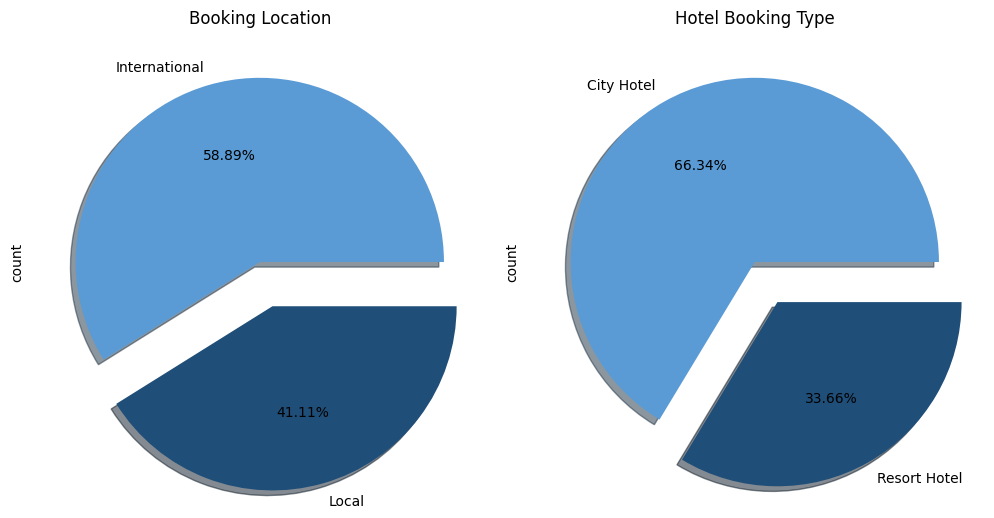

In [71]:
blue_colors = ['#5A9BD5', '#1F4E79']
plt.figure(figsize=(15, 7))
plt.subplot(1, 3, 1)
df_cleaned['booking_location'].value_counts().plot.pie(explode=[0, 0.25], 
                                               autopct='%1.2f%%',
                                               shadow=True,
                                               colors=blue_colors) 
plt.title('Booking Location')
plt.subplot(1, 3, 2)  
df_cleaned['hotel'].value_counts().plot.pie(explode=[0, 0.25], 
                                     autopct='%1.2f%%',
                                     shadow=True,
                                     colors=blue_colors)  
plt.title('Hotel Booking Type')

# Affichage
plt.tight_layout()  
plt.show()


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong>
Booking Market Segment & Distribution Channel </strong><br>

</p>


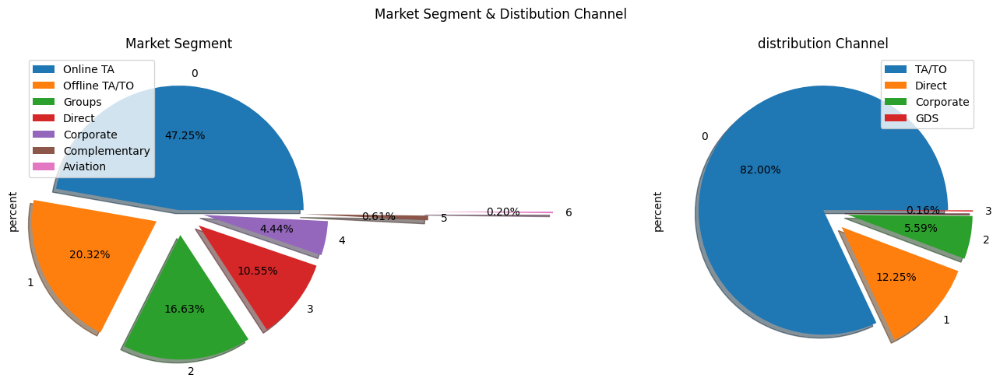

In [72]:
distribution_channel = df_cleaned.stb.freq(['distribution_channel'], cum_cols = False)
market_segment = df_cleaned.stb.freq(['market_segment'], cum_cols = False)
market_segment

plt.figure(figsize = (15, 5))

plt.subplot(1,2,1)
market_segment['percent'].plot.pie(explode = [0, 0.2, 0.2, 0.2, 0.2, 1, 2], 
                                               autopct = '%1.2f%%',
                                               shadow = True
                                               )
plt.legend(market_segment['market_segment'])
plt.title('Market Segment')

plt.subplot(1,2,2)
distribution_channel['percent'].plot.pie(explode = [0, 0.2, 0.2, 0.2], 
                                               autopct = '%1.2f%%',
                                               shadow = True
                                               )
plt.legend(distribution_channel['distribution_channel'])
plt.title('distribution Channel')

plt.suptitle('Market Segment & Distibution Channel')
plt.tight_layout()
plt.show()

<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> Deposit Type </strong><br>

</p>


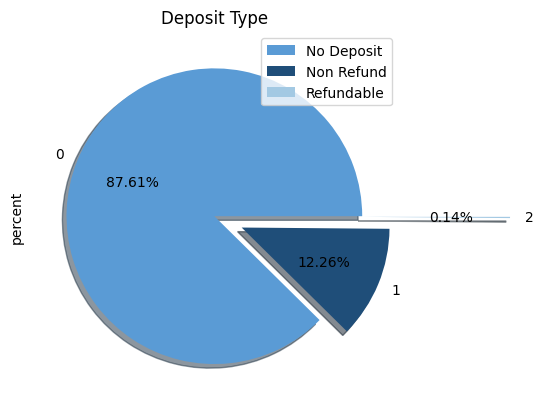

In [73]:
import matplotlib.pyplot as plt

# Définir les couleurs bleues
blue_colors = ['#5A9BD5', '#1F4E79', '#A3C9E3']  # Ajouter une troisième nuance de bleu pour plus de variation
deposit_type = df_cleaned.stb.freq(['deposit_type'], cum_cols=False)
deposit_type['percent'].plot.pie(explode=[0, 0.2, 1], 
                                 autopct='%1.2f%%',
                                 shadow=True,
                                 colors=blue_colors)  # Appliquer les couleurs bleues
plt.legend(deposit_type['deposit_type'])
plt.title('Deposit Type')

# Affichage
plt.show()


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> 
Map of the Booking </strong><br>

</p>


In [74]:
import plotly.express as px

# Création des données de fréquence pour les pays
country_data = df_cleaned.stb.freq(['country'], cum_cols=False)

# Création de la carte choroplèthe
guest_map = px.choropleth(country_data,
                    locations='country',  # Utilisation de la colonne 'country' pour localiser les pays
                    color='percent',  # Couleur en fonction du pourcentage
                    hover_name='country',  # Affichage du nom du pays lors du survol
                    color_continuous_scale=px.colors.sequential.Plasma,  # Choix de la palette de couleurs
                    title="Carte des Réservations par Pays")

# Affichage de la carte
guest_map.show()


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> 
The Distribution of ADR </strong><br>

</p>


In [75]:
import plotly.express as px

# Création de l'histogramme pour la distribution de l'ADR (tarif journalier moyen)
fig = px.histogram(df, x="adr",
                  title='Distribution de l\'ADR'
                  )

# Affichage du graphique
fig.show()

# Observation : Dans l'histogramme ci-dessous, on peut voir que la fréquence la plus élevée de l'ADR se situe autour de 61.5 - 62.49.


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> 
Arrival Date Month </strong><br>

</p>


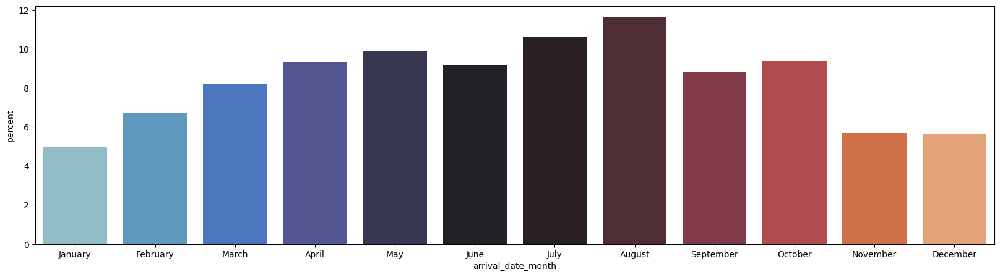

In [76]:
# Définition de l'ordre des mois de l'année
order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Calcul de la fréquence d'arrivée par mois
arrival = df_cleaned.stb.freq(['arrival_date_month'], cum_cols=False)

# Affichage d'un graphique à barres pour visualiser la distribution des pourcentages d'arrivées par mois
plt.figure(figsize=(20, 5))
sns.barplot(x='arrival_date_month', y='percent', data=arrival, order=order, palette='icefire')
plt.show()

# Observation : On remarque que le mois d'août a le pourcentage le plus élevé de réservations d'arrivées.
# Pourquoi cela ? 
# Les vacances d'été au Portugal ont lieu entre le 9 juin et le 12 septembre 2021.
# On suppose que les vacances d'été en 2015-2017 se sont produites autour des mêmes dates,
# ce qui pourrait expliquer pourquoi les réservations sont plus nombreuses en août.

# Cependant, dans ce jeu de données, nous constatons que les mois de juillet et août apparaissent 3 fois,
# tandis que les autres mois n'apparaissent que 2 fois. Cela influence certainement le pourcentage de réservations.


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> 
Arrival Month Year & ADR </strong><br>

</p>


In [77]:
import pandas as pd
import plotly.express as px


# 1. Calculer le nombre total de réservations par mois et année
monthly_reservations = df_cleaned.groupby('month_year')['hotel'].count().reset_index()

# 2. Calculer le pourcentage des réservations par mois
monthly_reservations['percent'] = (monthly_reservations['hotel'] / monthly_reservations['hotel'].sum()) * 100

# 3. Convertir la colonne 'month_year' en chaînes de caractères si nécessaire
monthly_reservations['month_year'] = monthly_reservations['month_year'].astype(str)

# 4. Créer le graphique à barres
fig = px.bar(monthly_reservations, x='month_year', y='percent', text='percent')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')

# Affichage du graphique
fig.show()

# Observation : Le graphique montrera la répartition des réservations par mois et année. Le pourcentage des réservations 
# sera plus élevé durant certaines périodes de l'année, par exemple pendant les mois d'été ou les vacances.


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> 
Arrival Month Year For Each Hotel & ADR </strong><br>

</p>


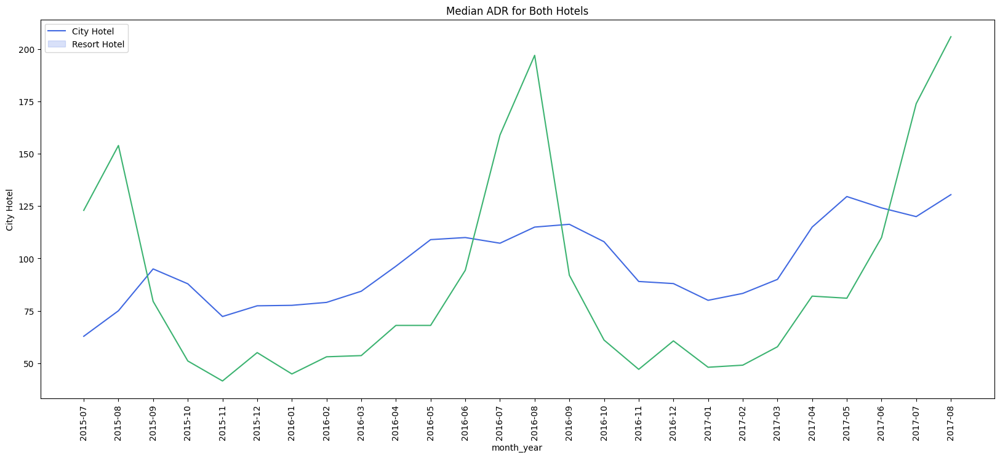

In [78]:
import plotly.graph_objects as go
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Conversion de la colonne 'month_year' en chaînes de caractères pour éviter le problème JSON
df_cleaned['month_year'] = df_cleaned['month_year'].astype(str)

# Création de la table croisée pour la normalisation des colonnes
hotel_month_year = pd.crosstab(df_cleaned['month_year'], df_cleaned['hotel'], normalize='columns')

# Graphique à barres avec couleurs personnalisées (sans orange)
fig = go.Figure(data=[
    go.Bar(name='City Hotel', x=hotel_month_year.index, y=hotel_month_year['City Hotel'], 
           marker_color='royalblue'),  # Couleur bleue pour City Hotel
    go.Bar(name='Resort Hotel', x=hotel_month_year.index, y=hotel_month_year['Resort Hotel'],
           marker_color='mediumseagreen')  # Couleur verte pour Resort Hotel
])

# Modifie l'affichage pour les barres groupées
fig.update_layout(barmode='group', title='Hotel Booking Type by Month Year', 
                  xaxis_title='Month-Year', yaxis_title='Normalized Booking Percentage')

# Affichage du graphique
fig.show()

# Analyser les tendances pour les hôtels
# Resort Hotel tends to perform better in winter months (November, December, January)
# City Hotel is more popular during warmer months like spring and summer.

# Table croisée pour ADR médian
hotel_month_year_adr = pd.crosstab(df_cleaned['month_year'], df_cleaned['hotel'], values=df_cleaned['adr'], aggfunc='median')

# Graphique de la médiane de l'ADR pour les deux types d'hôtels
plt.figure(figsize=(20, 8))
sns.lineplot(x=hotel_month_year_adr.index, y=hotel_month_year_adr['City Hotel'], color='royalblue')
sns.lineplot(x=hotel_month_year_adr.index, y=hotel_month_year_adr['Resort Hotel'], color='mediumseagreen')
plt.xticks(rotation=90)
plt.legend(['City Hotel', 'Resort Hotel'])
plt.title('Median ADR for Both Hotels')
plt.show()

# Commentaire d'observation :
# - Les prix ADR des Resort Hotels fluctuent plus que ceux des City Hotels.
# - Les prix des Resort Hotels augmentent généralement pendant l'été (de mai à juin), 
#   et diminuent de août à novembre. Une légère augmentation est observée en décembre, probablement due à Noël.
# - Les prix des City Hotels augmentent également au fil des années.


<a id='equilibre-classes'></a>
<p style="font-size: 20px; color: darkblue; font-family: 'Comic Sans MS';"> 
<strong> 
ADR effect on the number of cancellation
 </strong><br>

</p>


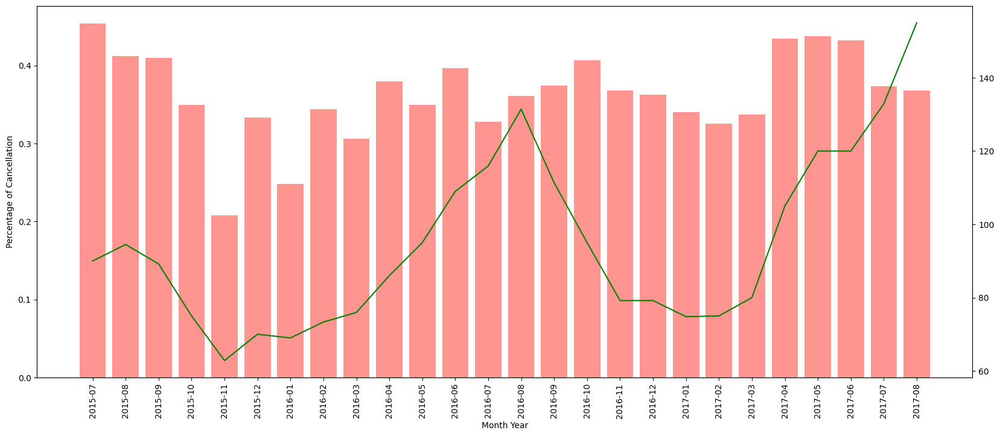

In [79]:
import plotly.express as px
# Assurez-vous que votre DataFrame df_cleaned est déjà chargé avec les bonnes données

# Calcul de la médiane du prix (ADR) par mois et année
month_year_adr = pd.crosstab(df_cleaned['month_year'], 'Median Price', values = df_cleaned['adr'], aggfunc = 'median')

# Affichage de la courbe pour la médiane du prix (ADR)
fig = px.line(month_year_adr, x = month_year_adr.index, y = 'Median Price', title = 'Median ADR')
fig.show()


# En général, la médiane de l'ADR suit le nombre de réservations comme on peut le voir pendant les périodes creuses (novembre, décembre, janvier)
# La médiane de l'ADR diminuera également
# Tandis que pendant les mois où l'hôtel est plus occupé (été) (mai, juin, juillet)
# La médiane de l'ADR aura tendance à augmenter également


# Préparation des données d'annulation
step = np.arange(0, 26)
month_year_cancellation = pd.crosstab(df_cleaned['month_year'], df_cleaned['is_canceled'], normalize = 'index')

# Création du graphique avec deux axes y
fig, ax1 = plt.subplots(figsize = (20, 8))

# Graphique en barres pour le pourcentage d'annulation
ax1.bar(step, month_year_cancellation[1], color = '#ff6961', alpha = 0.7)
ax1.set_xlabel('Month Year')
ax1.set_ylabel('Percentage of Cancellation')

# Graphique en ligne pour la médiane du prix
ax2 = ax1.twinx()
ax2.plot(month_year_adr.index, month_year_adr['Median Price'], color = '#008000')

# Personnalisation de l'affichage des ticks sur l'axe des x
ax1.set_xticks(step)
ax1.set_xticklabels(month_year_cancellation.index, rotation = 90)

# Affichage du graphique
plt.show()

# Commentaires pour interprétation
# Comme nous concluons que les annulations ont tendance à augmenter à mesure que le nombre de réservations augmente
# À mesure que le nombre de réservations augmente, l'ADR augmente également
# Ainsi, les mois avec plus d'annulations ont un ADR plus élevé par rapport aux mois avec peu d'annulations



In [80]:
print(df_cleaned.columns)



Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'adults', 'meal', 'country',
       'market_segment', 'distribution_channel', 'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled',
       'reserved_room_type', 'assigned_room_type', 'booking_changes',
       'deposit_type', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'arrival_date',
       'arrival_month', 'arrival_day', 'month_year', 'total_stays', 'guests',
       'kids', 'lead_time_month', 'booking_location',
       'is_previously_cancelled', 'is_booking_changes'],
      dtype='object')


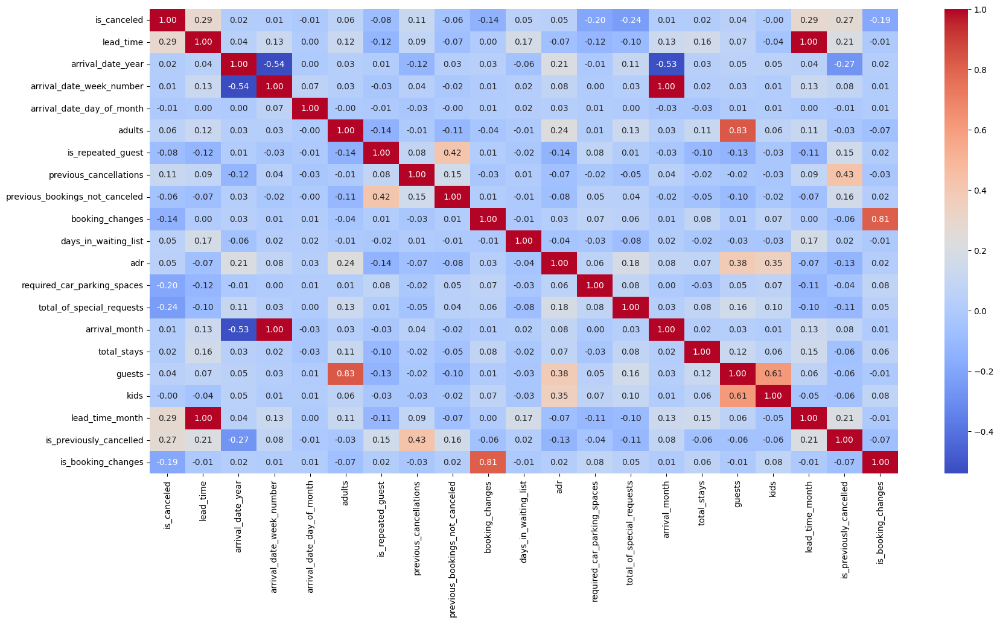

In [81]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculer une matrice de corrélation pour les variables catégorielles
correlation_matrix = df_cleaned.corr(numeric_only=True)

# Visualiser avec un heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

# Nous voyons que iscanceled a une corrélation de 1,00 avec l'état de la réservation et nous n'utiliserons donc pas l'état de la réservation.
# L'état de la réservation indique si la réservation a déjà été annulée, si le client s'est désisté ou s'il ne s'est pas présenté. 
# Le numéro et la date de l'état de la réservation ne seront pas pris en compte car notre objectif est de prédire l'état de la réservation.


In [82]:

df_cleaned['booking_location_encoded'] =df_cleaned['booking_location'].map({'International':1, 'Local':0})
df_cleaned['hotel_encoded'] = df_cleaned['hotel'].map({'City Hotel': 1, 'Resort Hotel':0})


In [83]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Initialiser le OneHotEncoder pour les colonnes catégorielles
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

# Initialiser le MinMaxScaler pour les colonnes numériques
scaler = MinMaxScaler()

# Liste des colonnes catégorielles et numériques
cat_columns = ['market_segment', 'deposit_type', 'customer_type']
num_columns = ['hotel_encoded', 'booking_location_encoded', 'lead_time', 
               'total_of_special_requests', 'is_previously_cancelled', 
               'is_repeated_guest', 'is_booking_changes', 'total_stays', 'guests']

# Créer le pipeline pour encoder les colonnes catégorielles et normaliser les colonnes numériques
preprocessor = ColumnTransformer([
    ('categorical', encoder, cat_columns),
    ('numerical', Pipeline([('imputer', SimpleImputer(strategy='mean')), ('scaler', scaler)]), num_columns)
])

# Sélectionner les features (X) et la target (y)
X = df_cleaned[['hotel_encoded','booking_location_encoded','lead_time', 
        'market_segment', 'deposit_type', 
        'total_of_special_requests', 'is_previously_cancelled', 
        'is_repeated_guest', 'is_booking_changes', 'customer_type', 
        'total_stays', 'guests']]

y = df['is_canceled']

# Appliquer les transformations sur X avant de séparer les données
X_transformed = preprocessor.fit_transform(X)

# Séparation des données en ensembles d'entraînement et de test (80% pour l'entraînement et 20% pour le test)
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

# Vérification de la forme des ensembles
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)


(95188, 23) (23797, 23)
(95188,) (23797,)


<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong>Model building</strong>
</p>


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Regression logistic</font></h3>

</div>


Performance sur l'ensemble d'entraînement:
Accuracy: 0.7959


Performance sur l'ensemble de test:
Accuracy: 0.7943


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.79      0.92      0.85     59950
           1       0.81      0.59      0.68     35238

    accuracy                           0.80     95188
   macro avg       0.80      0.75      0.77     95188
weighted avg       0.80      0.80      0.79     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.79      0.92      0.85     14921
           1       0.81      0.59      0.68      8876

    accuracy                           0.79     23797
   macro avg       0.80      0.75      0.76     23797
weighted avg       0.80      0.79      0.79     23797



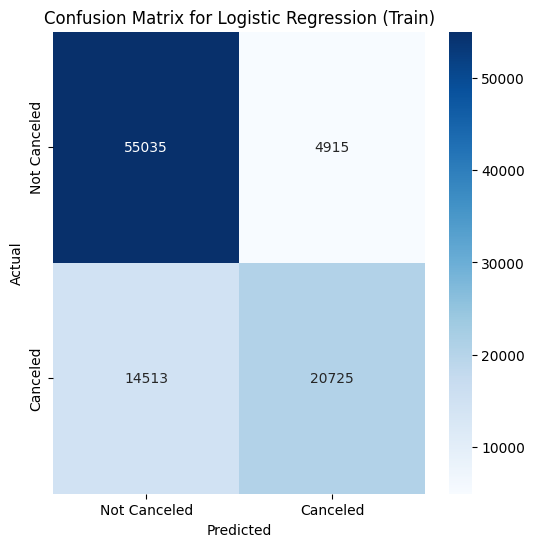

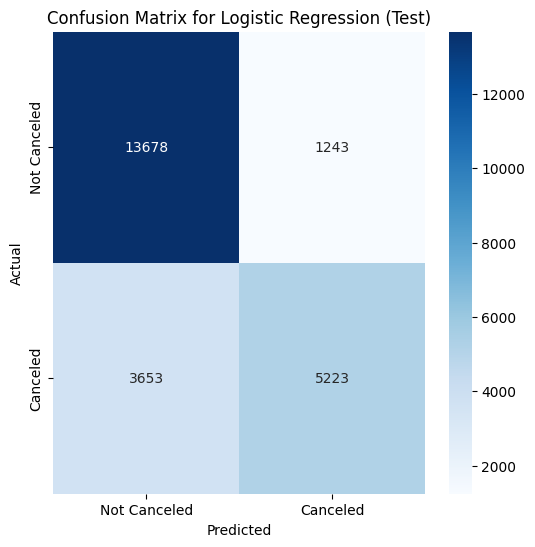

In [84]:
# Importation des bibliothèques nécessaires
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle de régression logistique
logreg = LogisticRegression()

# Entraînement du modèle
logreg.fit(X_train, y_train)

# Prédictions sur les ensembles de test et d'entraînement
y_pred_train = logreg.predict(X_train)
y_pred_test = logreg.predict(X_test)

# Évaluation sur l'ensemble d'entraînement
accuracy_train = accuracy_score(y_train, y_pred_train)
# AUC n'est pas utilisé ici, on reste uniquement sur l'accuracy
# AUC sur l'ensemble d'entraînement
# auc_train = roc_auc_score(y_train, logreg.predict_proba(X_train)[:, 1])

# Évaluation sur l'ensemble de test
accuracy_test = accuracy_score(y_test, y_pred_test)
# AUC sur l'ensemble de test
# auc_test = roc_auc_score(y_test, logreg.predict_proba(X_test)[:, 1])

# Affichage des métriques d'évaluation pour l'entraînement et le test
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
# print(f"AUC: {auc_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
# print(f"AUC: {auc_test:.4f}")
print("\n")

# Affichage du rapport de classification pour l'ensemble d'entraînement
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

# Affichage du rapport de classification pour l'ensemble de test
print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Affichage de la matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Logistic Regression (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Affichage de la matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Logistic Regression (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">KNN</font></h3>

</div>


Performance sur l'ensemble d'entraînement:
Accuracy: 0.8759


Performance sur l'ensemble de test:
Accuracy: 0.8322


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     59950
           1       0.86      0.79      0.83     35238

    accuracy                           0.88     95188
   macro avg       0.87      0.86      0.86     95188
weighted avg       0.88      0.88      0.87     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     14921
           1       0.80      0.73      0.76      8876

    accuracy                           0.83     23797
   macro avg       0.83      0.81      0.82     23797
weighted avg       0.83      0.83      0.83     23797



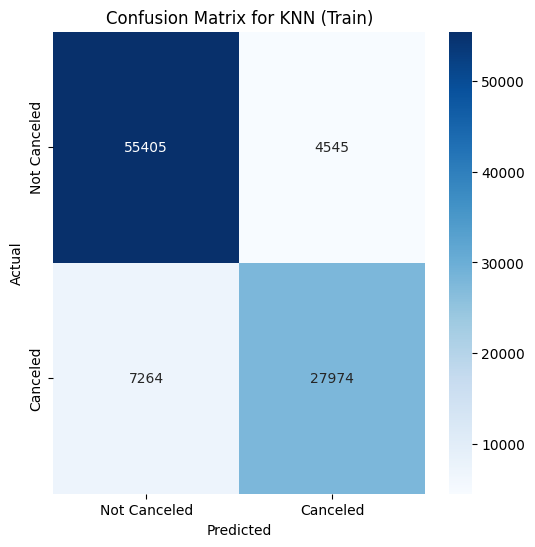

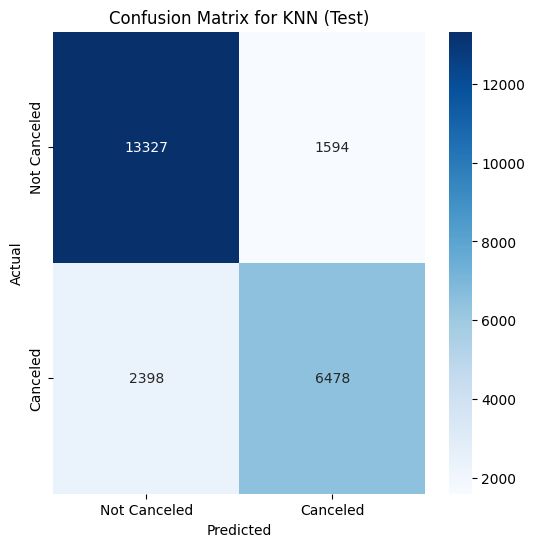

In [85]:
# Importation des bibliothèques nécessaires
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle KNN (avec un paramètre n_neighbors = 5, vous pouvez ajuster ce paramètre selon vos besoins)
knn = KNeighborsClassifier(n_neighbors=5)

# Entraînement du modèle
knn.fit(X_train, y_train)

# Prédictions sur les ensembles de test et d'entraînement
y_pred_train = knn.predict(X_train)
y_pred_test = knn.predict(X_test)

# Évaluation sur l'ensemble d'entraînement
accuracy_train = accuracy_score(y_train, y_pred_train)

# Évaluation sur l'ensemble de test
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des métriques d'évaluation pour l'entraînement et le test
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Affichage du rapport de classification pour l'ensemble d'entraînement
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

# Affichage du rapport de classification pour l'ensemble de test
print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Affichage de la matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for KNN (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Affichage de la matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for KNN (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Decision Tree Classifier</font></h3>

</div>


Performance sur l'ensemble d'entraînement:
Accuracy: 0.8005


Performance sur l'ensemble de test:
Accuracy: 0.8006


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.86      0.82      0.84     59950
           1       0.72      0.77      0.74     35238

    accuracy                           0.80     95188
   macro avg       0.79      0.79      0.79     95188
weighted avg       0.80      0.80      0.80     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.82      0.84     14921
           1       0.72      0.76      0.74      8876

    accuracy                           0.80     23797
   macro avg       0.79      0.79      0.79     23797
weighted avg       0.80      0.80      0.80     23797



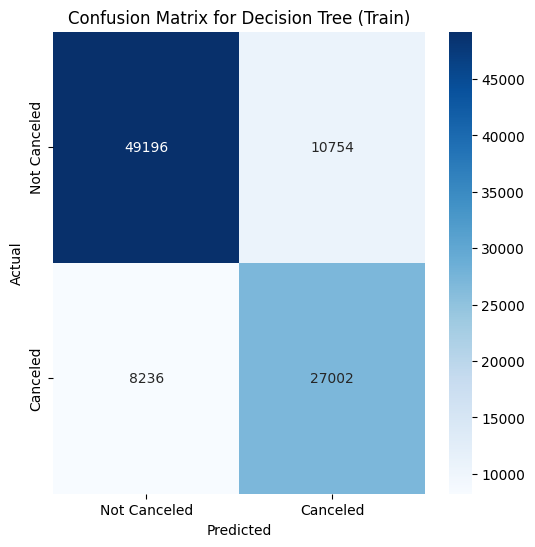

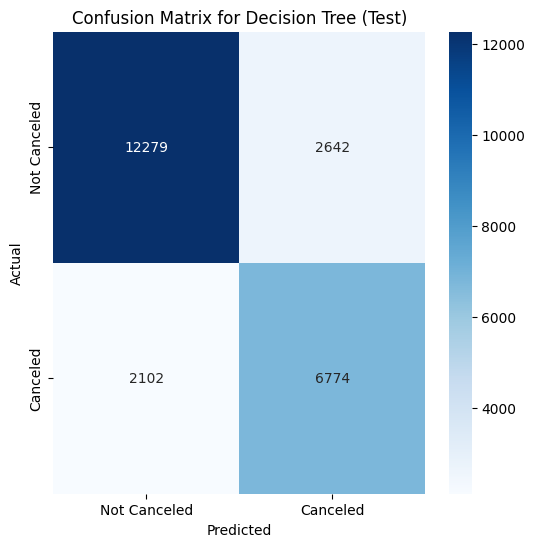

In [86]:
# Importation des bibliothèques nécessaires
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle de Decision Tree (vous pouvez ajuster le paramètre 'max_depth' selon vos besoins)
dt = DecisionTreeClassifier(random_state=42, max_depth=5)  # Exemple avec max_depth=5

# Entraînement du modèle
dt.fit(X_train, y_train)

# Prédictions sur les ensembles de test et d'entraînement
y_pred_train = dt.predict(X_train)
y_pred_test = dt.predict(X_test)

# Évaluation sur l'ensemble d'entraînement
accuracy_train = accuracy_score(y_train, y_pred_train)

# Évaluation sur l'ensemble de test
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des métriques d'évaluation pour l'entraînement et le test
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Affichage du rapport de classification pour l'ensemble d'entraînement
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

# Affichage du rapport de classification pour l'ensemble de test
print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Affichage de la matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Decision Tree (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Affichage de la matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Decision Tree (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Random Forest Classifier</font></h3>

</div>


Performance sur l'ensemble d'entraînement:
Accuracy: 0.9390


Performance sur l'ensemble de test:
Accuracy: 0.8312


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     59950
           1       0.94      0.90      0.92     35238

    accuracy                           0.94     95188
   macro avg       0.94      0.93      0.93     95188
weighted avg       0.94      0.94      0.94     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     14921
           1       0.79      0.74      0.77      8876

    accuracy                           0.83     23797
   macro avg       0.82      0.81      0.82     23797
weighted avg       0.83      0.83      0.83     23797



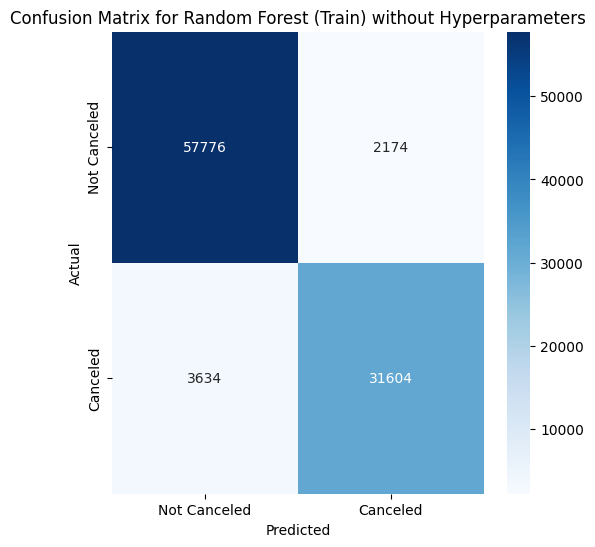

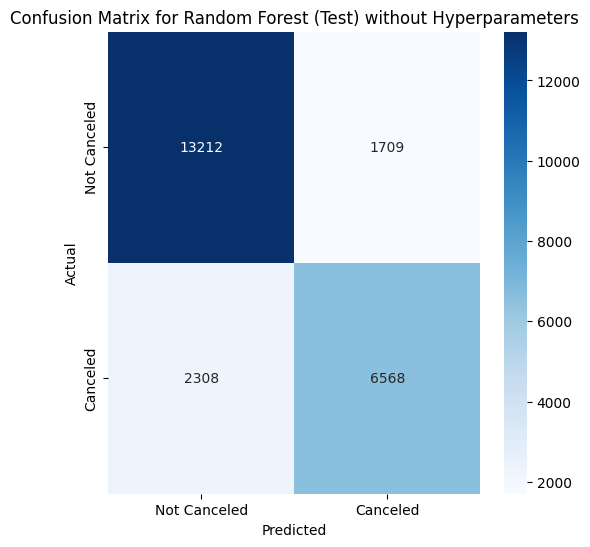

In [87]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle Random Forest sans hyperparamètres ajustés
rf = RandomForestClassifier(
    random_state=42  # Pour la reproductibilité
)

# Entraînement du modèle
rf.fit(X_train, y_train)

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train = rf.predict(X_train)
y_pred_test = rf.predict(X_test)

# Évaluation des performances
accuracy_train = accuracy_score(y_train, y_pred_train)
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des résultats
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Rapport de classification
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Random Forest (Train) without Hyperparameters')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Random Forest (Test) without Hyperparameters')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">XGBoost Classifier</font></h3>

</div>


Performance sur l'ensemble d'entraînement:
Accuracy: 0.8518


Performance sur l'ensemble de test:
Accuracy: 0.8417


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.86      0.91      0.89     59950
           1       0.83      0.75      0.79     35238

    accuracy                           0.85     95188
   macro avg       0.85      0.83      0.84     95188
weighted avg       0.85      0.85      0.85     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.91      0.88     14921
           1       0.82      0.73      0.78      8876

    accuracy                           0.84     23797
   macro avg       0.84      0.82      0.83     23797
weighted avg       0.84      0.84      0.84     23797



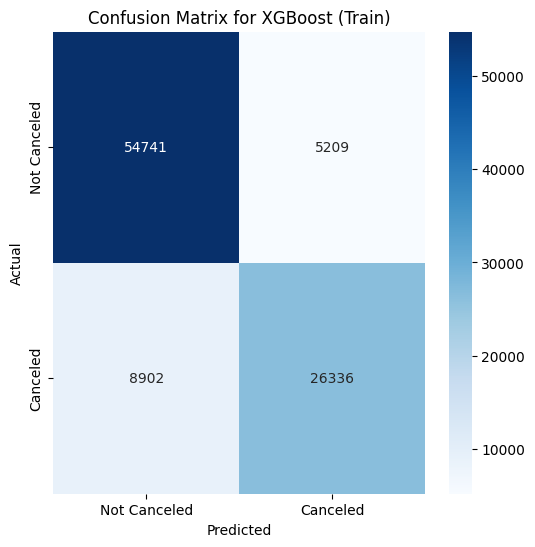

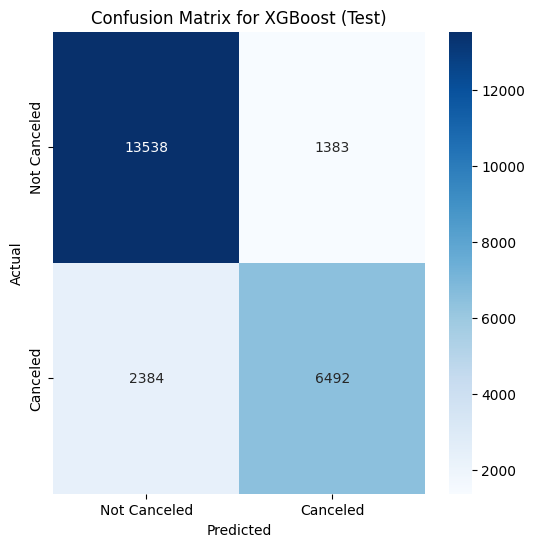

In [88]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle XGBoost
xgb = XGBClassifier(
    random_state=42,
)

# Entraînement du modèle
xgb.fit(X_train, y_train)

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train = xgb.predict(X_train)
y_pred_test = xgb.predict(X_test)

# Évaluation des performances
accuracy_train = accuracy_score(y_train, y_pred_train)
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des résultats
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Rapport de classification
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for XGBoost (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for XGBoost (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">CatBoost Classifier</font></h3>

</div>


Performance sur l'ensemble d'entraînement:
Accuracy: 0.8537


Performance sur l'ensemble de test:
Accuracy: 0.8441


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.86      0.92      0.89     59950
           1       0.84      0.75      0.79     35238

    accuracy                           0.85     95188
   macro avg       0.85      0.83      0.84     95188
weighted avg       0.85      0.85      0.85     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.91      0.88     14921
           1       0.83      0.73      0.78      8876

    accuracy                           0.84     23797
   macro avg       0.84      0.82      0.83     23797
weighted avg       0.84      0.84      0.84     23797



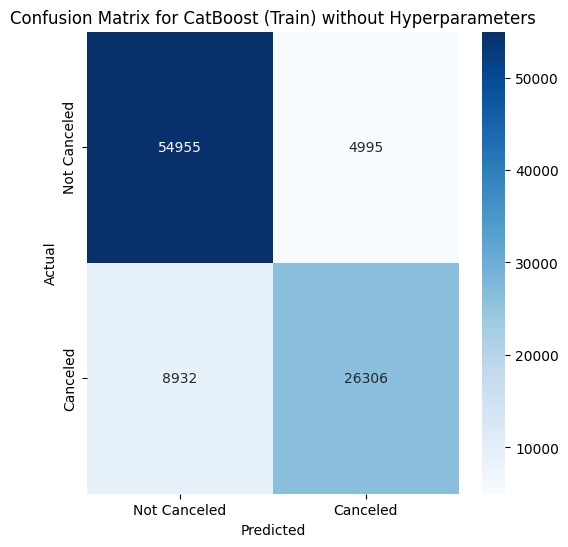

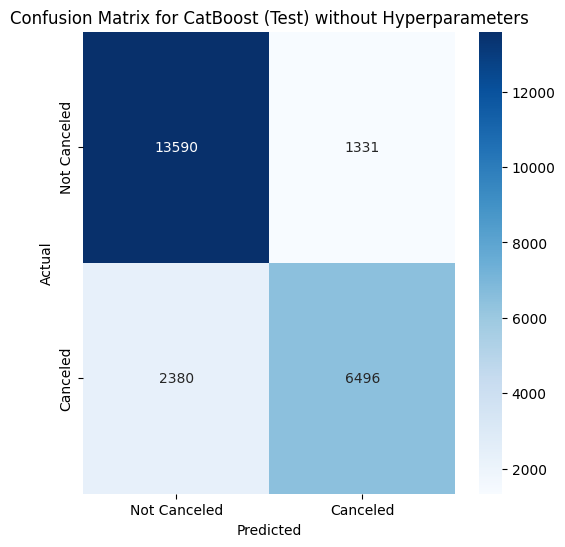

In [89]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle CatBoostClassifier sans hyperparamètres ajustés
catboost = CatBoostClassifier(
    random_seed=42,  # Pour la reproductibilité
    verbose=0         # Réduit les logs pendant l'entraînement
)

# Entraînement du modèle
catboost.fit(X_train, y_train)

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train = catboost.predict(X_train)
y_pred_test = catboost.predict(X_test)

# Évaluation des performances
accuracy_train = accuracy_score(y_train, y_pred_train)
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des résultats
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Rapport de classification
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for CatBoost (Train) without Hyperparameters')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for CatBoost (Test) without Hyperparameters')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">LightGBM</font></h3>

</div>


[LightGBM] [Info] Number of positive: 35238, number of negative: 59950
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 95188, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370194 -> initscore=-0.531386
[LightGBM] [Info] Start training from score -0.531386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Performance sur l'ensemble d'entraînement:
Accuracy: 0.8384


Performance sur l'ensemble de test:
Accuracy: 0.8349


Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.85      0.90      0.88     59950
           1       0.81      0.74      0.77     35238

    accuracy                           0.84     9

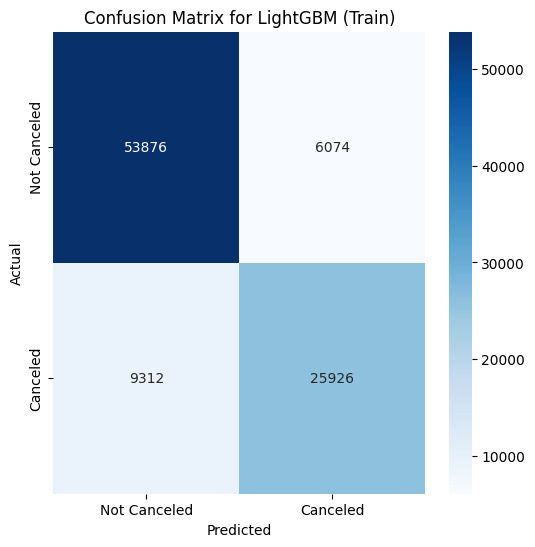

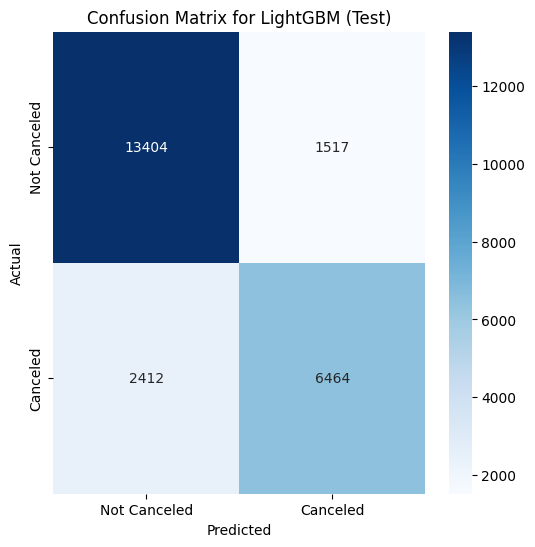

In [90]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialisation du modèle LightGBM
lgbm = lgb.LGBMClassifier(
    n_estimators=100,         # Nombre d'arbres
    learning_rate=0.1,        # Taux d'apprentissage
    max_depth=6,              # Profondeur maximale des arbres
    random_state=42           # Pour la reproductibilité
)

# Entraînement du modèle
lgbm.fit(X_train, y_train)

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train = lgbm.predict(X_train)
y_pred_test = lgbm.predict(X_test)

# Évaluation des performances
accuracy_train = accuracy_score(y_train, y_pred_train)
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des résultats
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Rapport de classification
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for LightGBM (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for LightGBM (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong>Model Comparaison</strong>
</p>


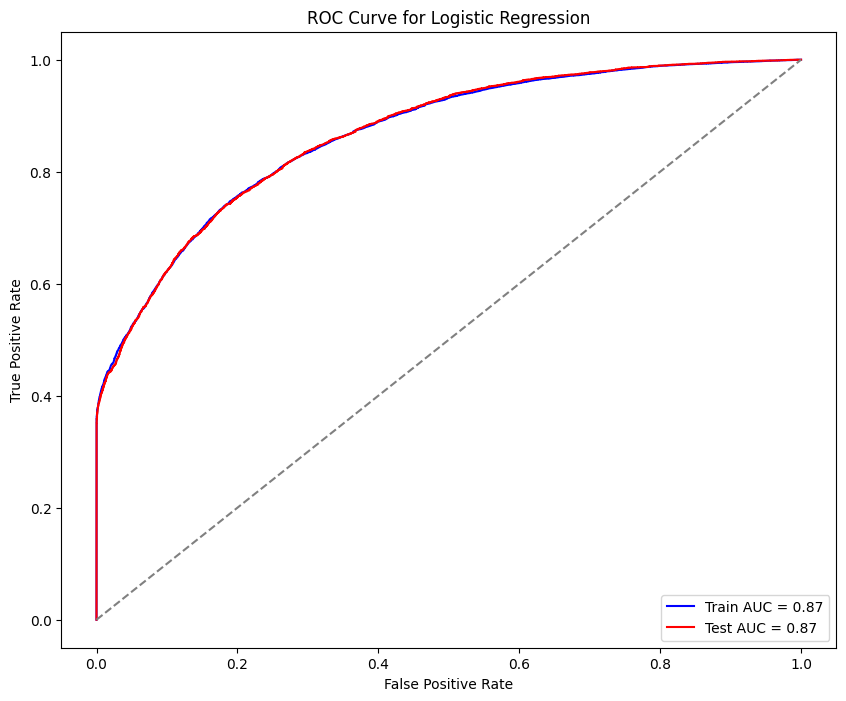

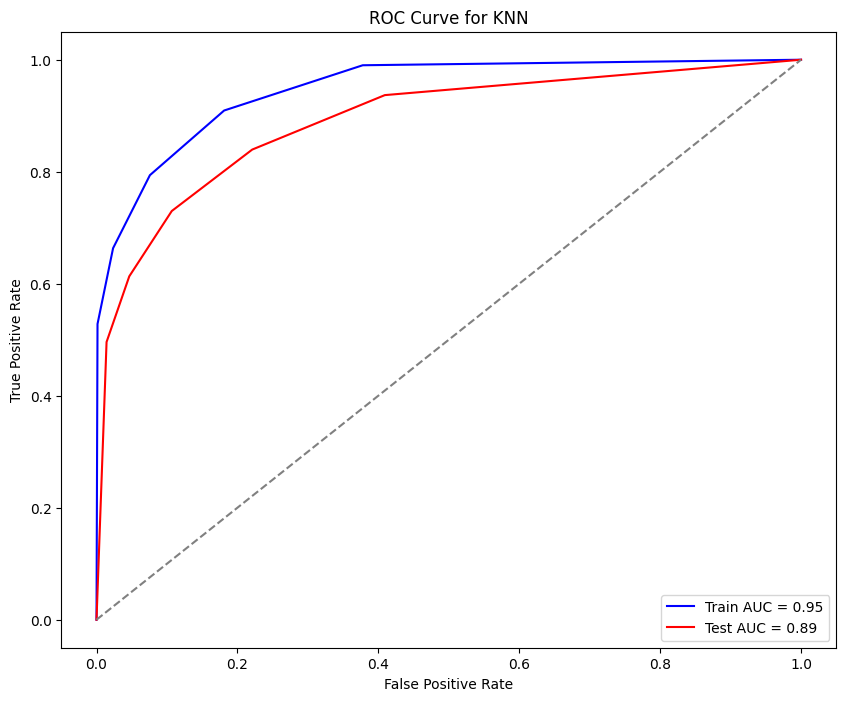

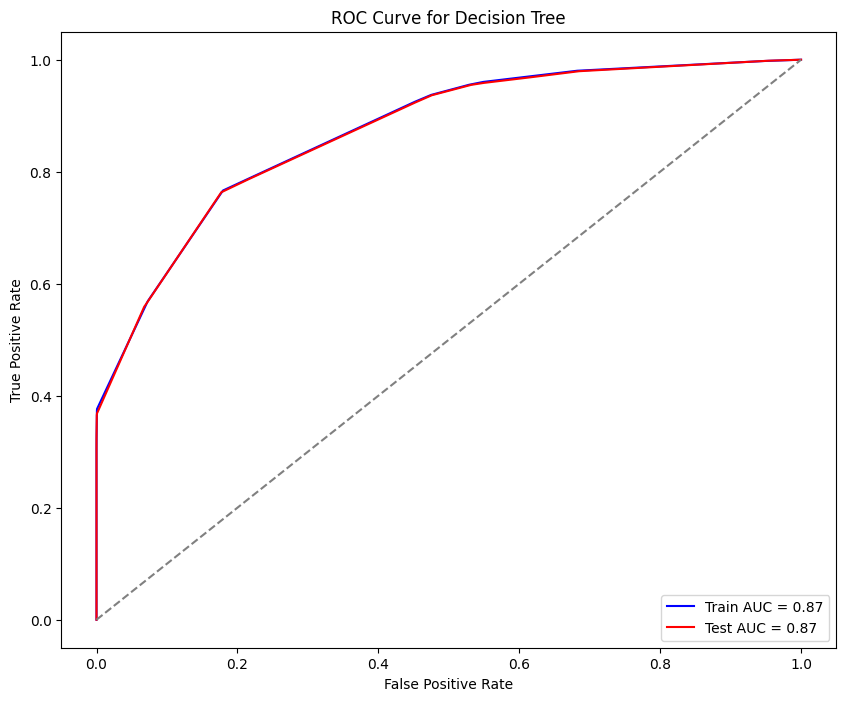

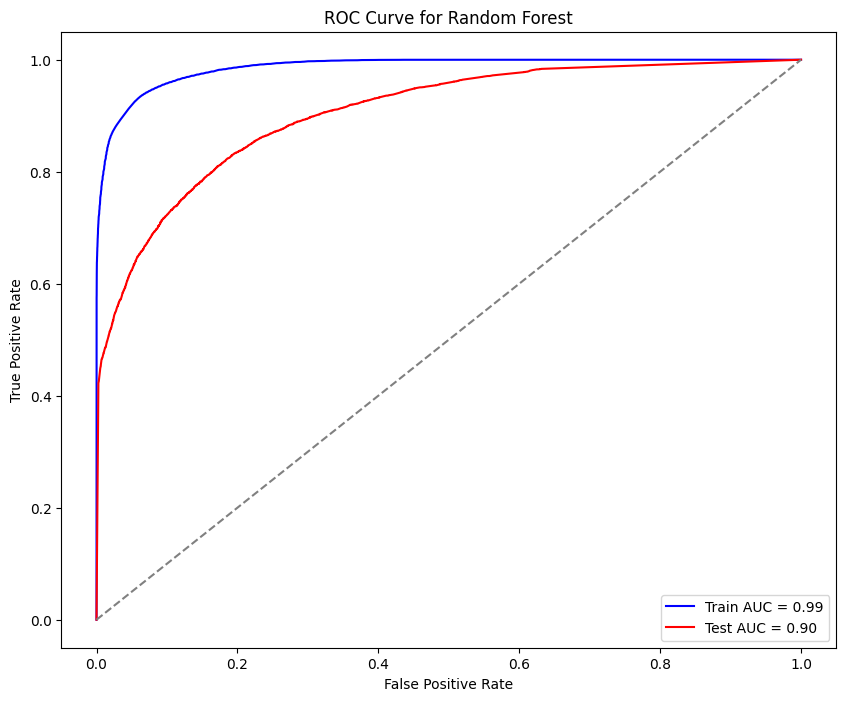

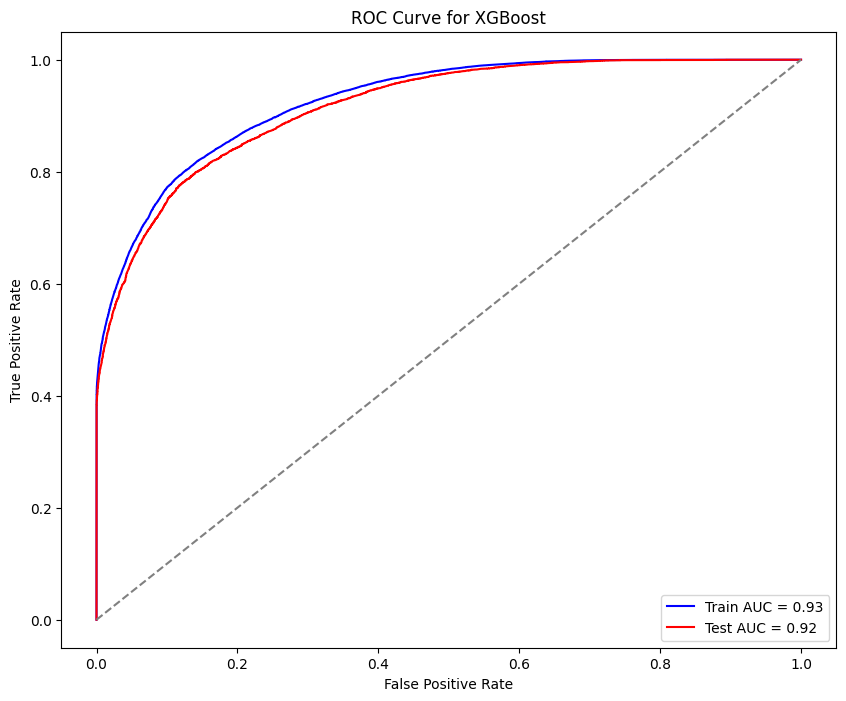

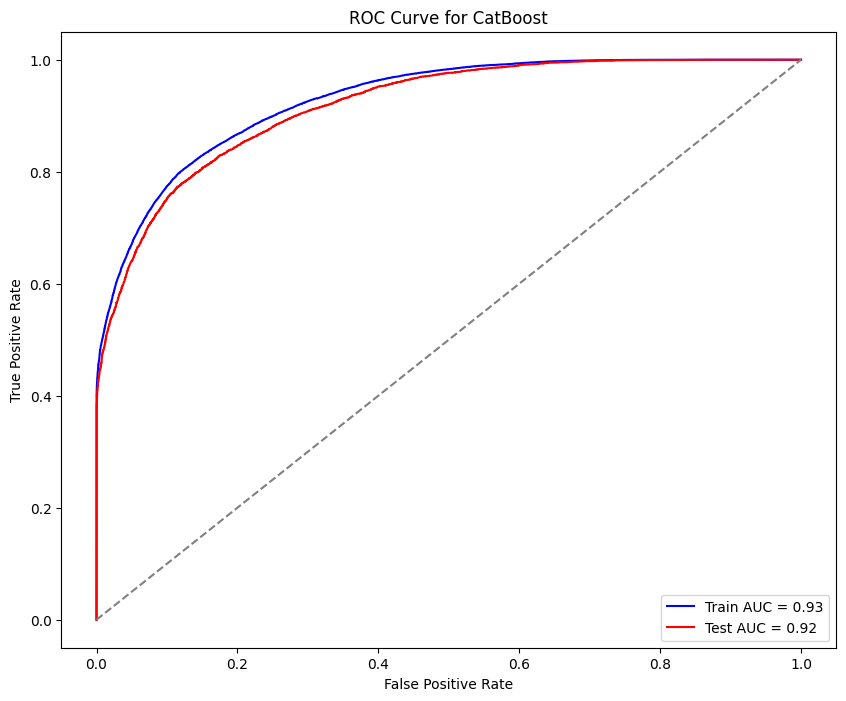

[LightGBM] [Info] Number of positive: 35238, number of negative: 59950
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.180892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 95188, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370194 -> initscore=-0.531386
[LightGBM] [Info] Start training from score -0.531386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


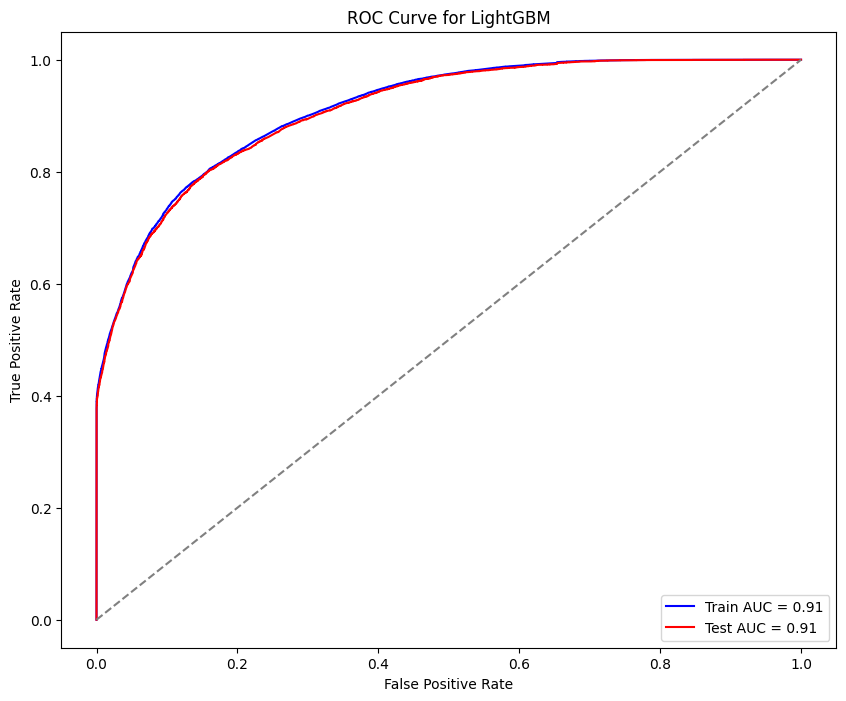

,Model,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score,Train AUC,Test AUC
0,Logistic Regression,0.795899,0.794260,0.797611,0.796138,0.795899,0.794260,0.787373,0.785787,0.867041,0.867723
1,KNN,0.875940,0.832248,0.875259,0.830728,0.875940,0.832248,0.874827,0.830469,0.947228,0.890793
2,Decision Tree,0.800500,0.800647,0.804241,0.803697,0.800500,0.800647,0.801801,0.801753,0.871777,0.870842
3,Random Forest,0.938984,0.831197,0.938904,0.829743,0.938984,0.831197,0.938706,0.829911,0.986189,0.904636
4,XGBoost,0.851757,0.841703,0.850777,0.840614,0.851757,0.841703,0.849872,0.839542,0.926433,0.916695
5,CatBoost,0.853690,0.844056,0.852872,0.843129,0.853690,0.844056,0.851687,0.841807,0.928214,0.917730
6,LightGBM,0.838362,0.834895,0.836918,0.833482,0.838362,0.834895,0.836595,0.832916,0.912940,0.910066


In [91]:
# Importation des bibliothèques nécessaires
from sklearn.metrics import classification_report, roc_curve, auc
from sklearn.model_selection import train_test_split
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import lightgbm as lgb
import numpy as np

# Fonction pour obtenir les métriques sous forme de dictionnaire
def get_classification_metrics(y_true, y_pred):
    report = classification_report(y_true, y_pred, output_dict=True)
    return {
        'precision': report['weighted avg']['precision'],
        'recall': report['weighted avg']['recall'],
        'f1_score': report['weighted avg']['f1-score'],
        'accuracy': report['accuracy']
    }

# Modèles et résultats
models = {
    'Logistic Regression': logreg,
    'KNN': knn,
    'Decision Tree': dt,
    'Random Forest': rf,
    'XGBoost': xgb,
    'CatBoost': catboost,
    'LightGBM': lgbm
}

# Création d'un DataFrame vide pour stocker les résultats
metrics_df = pd.DataFrame(columns=['Model', 'Train Accuracy', 'Test Accuracy', 'Train Precision', 'Test Precision',
                                   'Train Recall', 'Test Recall', 'Train F1-Score', 'Test F1-Score', 'Train AUC', 'Test AUC'])

# Calcul des métriques pour chaque modèle
for model_name, model in models.items():
    # Entraînement du modèle
    model.fit(X_train, y_train)
    
    # Prédictions sur les ensembles d'entraînement et de test
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Calcul des probabilités prédites pour la courbe ROC
    y_pred_train_prob = model.predict_proba(X_train)[:, 1]  # Probabilités pour la classe positive
    y_pred_test_prob = model.predict_proba(X_test)[:, 1]    # Probabilités pour la classe positive
    
    # Calcul des métriques pour l'ensemble d'entraînement et de test
    train_metrics = get_classification_metrics(y_train, y_pred_train)
    test_metrics = get_classification_metrics(y_test, y_pred_test)
    
    # Calcul des courbes ROC et des AUC
    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_train_prob)
    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred_test_prob)
    
    train_auc = auc(fpr_train, tpr_train)
    test_auc = auc(fpr_test, tpr_test)
    
    # Créer un DataFrame temporaire pour chaque modèle
    temp_df = pd.DataFrame({
        'Model': [model_name],
        'Train Accuracy': [train_metrics['accuracy']],
        'Test Accuracy': [test_metrics['accuracy']],
        'Train Precision': [train_metrics['precision']],
        'Test Precision': [test_metrics['precision']],
        'Train Recall': [train_metrics['recall']],
        'Test Recall': [test_metrics['recall']],
        'Train F1-Score': [train_metrics['f1_score']],
        'Test F1-Score': [test_metrics['f1_score']],
        'Train AUC': [train_auc],
        'Test AUC': [test_auc]
    })
    
    # Concaténer les résultats dans le DataFrame principal
    metrics_df = pd.concat([metrics_df, temp_df], ignore_index=True)
    
    # Tracer les courbes ROC pour chaque modèle
    plt.figure(figsize=(10, 8))
    plt.plot(fpr_train, tpr_train, color='blue', label=f'Train AUC = {train_auc:.2f}')
    plt.plot(fpr_test, tpr_test, color='red', label=f'Test AUC = {test_auc:.2f}')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Ligne de référence pour un modèle aléatoire
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

# Pour un affichage plus joli et lisible dans un Jupyter Notebook
from IPython.display import display
display(metrics_df)


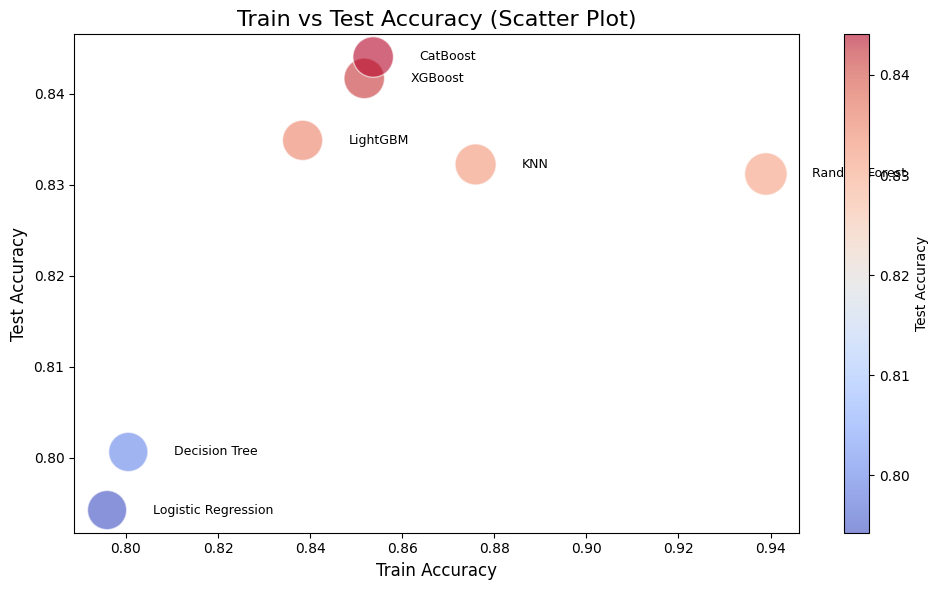

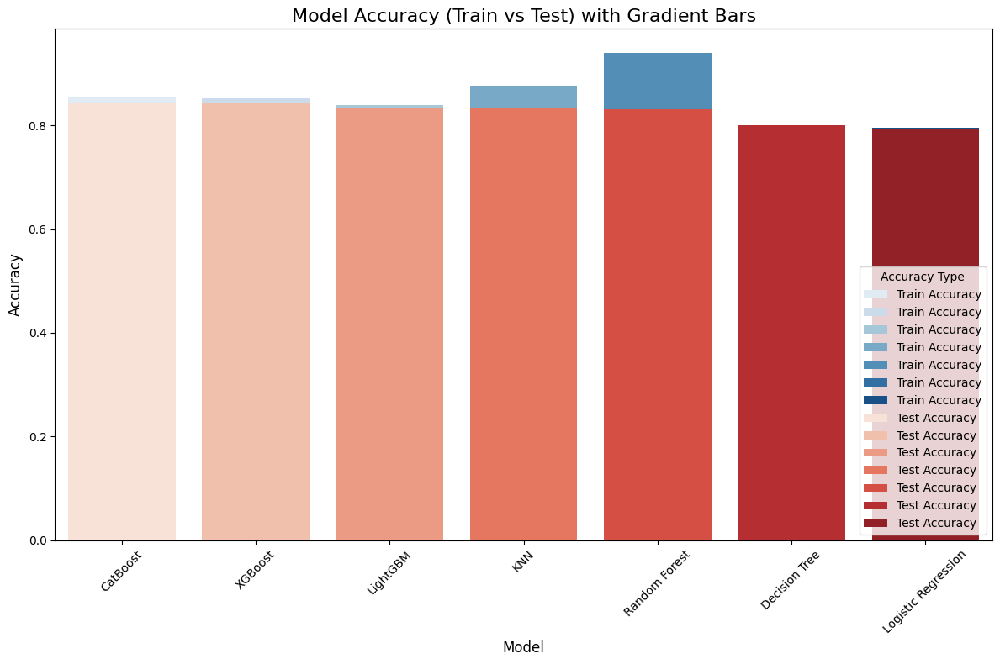

In [92]:
plt.figure(figsize=(10, 6))

# Scatter plot avec taille et couleur différentes
plt.scatter(metrics_df['Train Accuracy'], metrics_df['Test Accuracy'], s=metrics_df['Train Accuracy']*1000, 
            c=metrics_df['Test Accuracy'], cmap='coolwarm', alpha=0.6, edgecolors='w', linewidth=1)

# Ajouter les étiquettes des modèles
for i, model in enumerate(metrics_df['Model']):
    plt.text(metrics_df['Train Accuracy'][i] + 0.01, metrics_df['Test Accuracy'][i], model, 
             fontsize=9, ha='left', va='center')

# Ajouter les titres et les labels
plt.title('Train vs Test Accuracy (Scatter Plot)', fontsize=16)
plt.xlabel('Train Accuracy', fontsize=12)
plt.ylabel('Test Accuracy', fontsize=12)
plt.colorbar(label='Test Accuracy')
plt.tight_layout()
plt.show()

# Trier les résultats si nécessaire (facultatif)
metrics_df_sorted = metrics_df.sort_values(by='Test Accuracy', ascending=False)

plt.figure(figsize=(12, 8))

# Création des barres avec un gradient pour l'entraînement
sns.barplot(x='Model', y='Train Accuracy', data=metrics_df_sorted, palette='Blues', ci=None, label='Train Accuracy')
sns.barplot(x='Model', y='Test Accuracy', data=metrics_df_sorted, palette='Reds', ci=None, label='Test Accuracy')

# Ajouter les titres et les labels
plt.title('Model Accuracy (Train vs Test) with Gradient Bars', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Accuracy Type", loc='lower right')

# Affichage du graphique
plt.tight_layout()
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Logistic Regression</font></h3>

- **Overfitting** : Pas de signe d'overfitting majeur, car la différence entre la précision d'entraînement et de test est faible.
- **Faux Positifs et Faux Négatifs** : Bon compromis entre précision et rappel, avec un bon équilibre entre faux positifs et faux négatifs.
- **Hyperparamètres** : Aucune nécessité immédiate d'ajuster les hyperparamètres, car le modèle généralise bien.

</div>

<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">KNN Classifier</font></h3>

- **Overfitting** : La différence notable entre la précision d'entraînement et de test suggère un léger overfitting.
- **Faux Positifs et Faux Négatifs** : Peut souffrir de faux positifs, particulièrement si les données sont bruyantes.
- **Hyperparamètres** : Il est recommandé de tester différentes valeurs de `k` et d'explorer des techniques comme la réduction de dimension (PCA).

</div>

<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Decision Tree Classifier</font></h3>

- **Overfitting** : Pas d'overfitting, le modèle généralise bien sans surajuster les données d'entraînement.
- **Faux Positifs et Faux Négatifs** : Bonne gestion des faux positifs et faux négatifs grâce à la structure simple des arbres de décision.
- **Hyperparamètres** : Aucun ajustement majeur nécessaire, mais la profondeur des arbres pourrait être ajustée si nécessaire.

</div>

<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Random Forest Classifier</font></h3>

- **Overfitting** : Présente un **overfitting grave** avec une grande différence entre la précision d'entraînement et de test.
- **Faux Positifs et Faux Négatifs** : L'overfitting pourrait entraîner des faux positifs ou des faux négatifs plus fréquents sur les nouvelles données.
- **Hyperparamètres** : Il est nécessaire de régler les paramètres comme `n_estimators`, `max_depth`, `min_samples_split` pour limiter l'overfitting.

</div>

<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">XGBoost Classifier</font></h3>

- **Overfitting** : Le modèle ne présente pas de surapprentissage majeur, avec une faible différence entre les précisions d'entraînement et de test.
- **Faux Positifs et Faux Négatifs** : Bon compromis entre précision et rappel avec peu de faux positifs ou négatifs.
- **Hyperparamètres** : Bien qu'il n'y ait pas de surajustement évident, ajuster des paramètres comme le `learning_rate` et la `max_depth` peut encore améliorer les performances.

</div>

<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">CatBoost Classifier</font></h3>

- **Overfitting** : Comme pour XGBoost, pas de surajustement majeur observé. Le modèle généralise bien.
- **Faux Positifs et Faux Négatifs** : Bon compromis entre précision et rappel, bien équilibré.
- **Hyperparamètres** : Des ajustements sur les paramètres comme `learning_rate` et `depth` peuvent être testés pour une amélioration marginale.

</div>

<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">LightGBM Classifier</font></h3>

- **Overfitting** : Le modèle présente une faible différence entre la précision d'entraînement et de test, ce qui suggère une bonne généralisation.
- **Faux Positifs et Faux Négatifs** : Bon compromis entre précision et rappel avec un faible taux de faux positifs et faux négatifs.
- **Hyperparamètres** : Le modèle est assez robuste par défaut, mais l'ajustement de paramètres comme le `learning_rate` et la `max_depth` pourrait améliorer encore les performances.

</div>


<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong>Tuning Hyperparameters<strong>
</p>


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">KNN</font></h3>

</div>


In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# Normalisation des données avant PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Application du PCA (choisir le nombre de composantes principales)
pca = PCA(n_components=2)  # Vous pouvez ajuster n_components en fonction de votre besoin
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Initialisation du modèle KNN (avec un paramètre n_neighbors = 5, vous pouvez ajuster ce paramètre selon vos besoins)
knn = KNeighborsClassifier(n_neighbors=5)

# Entraînement du modèle avec les données transformées par PCA
knn.fit(X_train_pca, y_train)

# Prédictions sur les ensembles de test et d'entraînement
y_pred_train = knn.predict(X_train_pca)
y_pred_test = knn.predict(X_test_pca)

# Évaluation sur l'ensemble d'entraînement
accuracy_train = accuracy_score(y_train, y_pred_train)

# Évaluation sur l'ensemble de test
accuracy_test = accuracy_score(y_test, y_pred_test)

# Affichage des métriques d'évaluation pour l'entraînement et le test
print("Performance sur l'ensemble d'entraînement:")
print(f"Accuracy: {accuracy_train:.4f}")
print("\n")
print("Performance sur l'ensemble de test:")
print(f"Accuracy: {accuracy_test:.4f}")
print("\n")

# Affichage du rapport de classification pour l'ensemble d'entraînement
print("Classification Report (Entraînement):")
print(classification_report(y_train, y_pred_train))

# Affichage du rapport de classification pour l'ensemble de test
print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test))

# Affichage de la matrice de confusion pour l'ensemble d'entraînement
cm_train = confusion_matrix(y_train, y_pred_train)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for KNN (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Affichage de la matrice de confusion pour l'ensemble de test
cm_test = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for KNN (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Random Forest Classifier</font></h3>

</div>


Meilleurs paramètres trouvés :
{'n_estimators': 30, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': False}

Validation croisée (moyenne des scores):
Mean CV Accuracy: 0.8348

Performance sur l'ensemble d'entraînement (avec les meilleurs paramètres):
Accuracy: 0.9135

Performance sur l'ensemble de test (avec les meilleurs paramètres):
Accuracy: 0.8402

Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.91      0.96      0.93     59950
           1       0.92      0.84      0.88     35238

    accuracy                           0.91     95188
   macro avg       0.91      0.90      0.91     95188
weighted avg       0.91      0.91      0.91     95188

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.90      0.88     14921
           1       0.82      0.73      0.77      8876

    accuracy                    

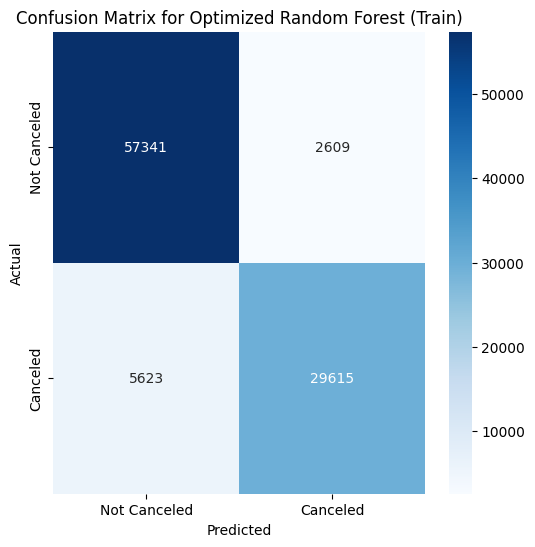

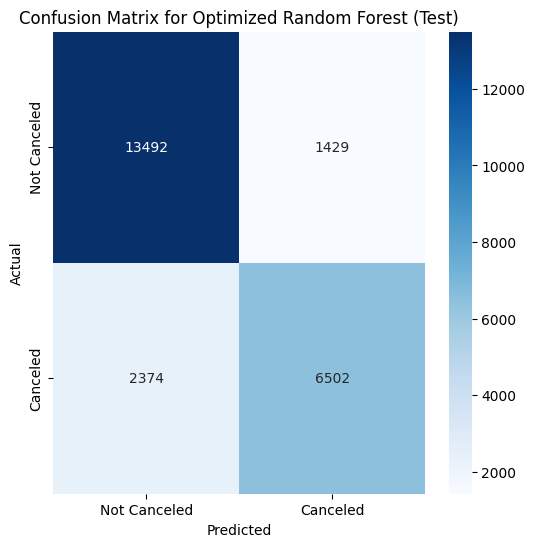

In [94]:
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Définir les hyperparamètres à tester 
param_dist = {
    'n_estimators': [30, 50],                   # Nombre d'arbres dans la forêt, réduit pour accélérer
    'max_depth': [5, 10, None],                  # Profondeur maximale des arbres
    'min_samples_split': [2, 5],                  # Minimum d'échantillons pour diviser un nœud
    'min_samples_leaf': [1, 2],                   # Minimum d'échantillons dans une feuille
    'max_features': ['auto', 'sqrt'],            # Nombre maximum de features à considérer pour chaque arbre
    'bootstrap': [True, False]                    # Utiliser le bootstrap ou non
}

# Initialisation du modèle Random Forest
rf = RandomForestClassifier(random_state=42)

# Recherche aléatoire avec validation croisée (réduit n_iter et cv pour plus de rapidité)
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, 
                                   n_iter=5, cv=2, verbose=1, random_state=42, n_jobs=-1, scoring='accuracy')

# Entraînement du modèle avec la recherche aléatoire
random_search.fit(X_train, y_train)

# Meilleurs paramètres
print("Meilleurs paramètres trouvés :")
print(random_search.best_params_)

# Meilleur modèle trouvé par RandomizedSearchCV
best_rf = random_search.best_estimator_

# Validation croisée (score moyen de validation)
cv_scores = cross_val_score(best_rf, X_train, y_train, cv=2, scoring='accuracy', n_jobs=-1)
print("\nValidation croisée (moyenne des scores):")
print(f"Mean CV Accuracy: {cv_scores.mean():.4f}")

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train_best = best_rf.predict(X_train)
y_pred_test_best = best_rf.predict(X_test)

# Évaluation des performances avec le meilleur modèle
accuracy_train_best = accuracy_score(y_train, y_pred_train_best)
accuracy_test_best = accuracy_score(y_test, y_pred_test_best)

print("\nPerformance sur l'ensemble d'entraînement (avec les meilleurs paramètres):")
print(f"Accuracy: {accuracy_train_best:.4f}")
print("\nPerformance sur l'ensemble de test (avec les meilleurs paramètres):")
print(f"Accuracy: {accuracy_test_best:.4f}")

# Rapport de classification avec le meilleur modèle
print("\nClassification Report (Entraînement):")
print(classification_report(y_train, y_pred_train_best))

print("Classification Report (Test):")
print(classification_report(y_test, y_pred_test_best))

# Matrice de confusion avec le meilleur modèle
cm_train_best = confusion_matrix(y_train, y_pred_train_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Optimized Random Forest (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

cm_test_best = confusion_matrix(y_test, y_pred_test_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for Optimized Random Forest (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">XGBoost Classifier</font></h3>

</div>


Fitting 3 folds for each of 10 candidates, totalling 30 fits

Meilleurs paramètres trouvés :
{'subsample': 0.8, 'n_estimators': 150, 'max_depth': 12, 'learning_rate': 0.05, 'colsample_bytree': 0.7}

Mean CV Accuracy: 0.8455

Performance sur l'ensemble d'entraînement: 0.8609
Performance sur l'ensemble de test: 0.8462

Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.87      0.92      0.89     59950
           1       0.85      0.76      0.80     35238

    accuracy                           0.86     95188
   macro avg       0.86      0.84      0.85     95188
weighted avg       0.86      0.86      0.86     95188


Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.91      0.88     14921
           1       0.83      0.74      0.78      8876

    accuracy                           0.85     23797
   macro avg       0.84      0.82      0.83     23797
weighted avg 

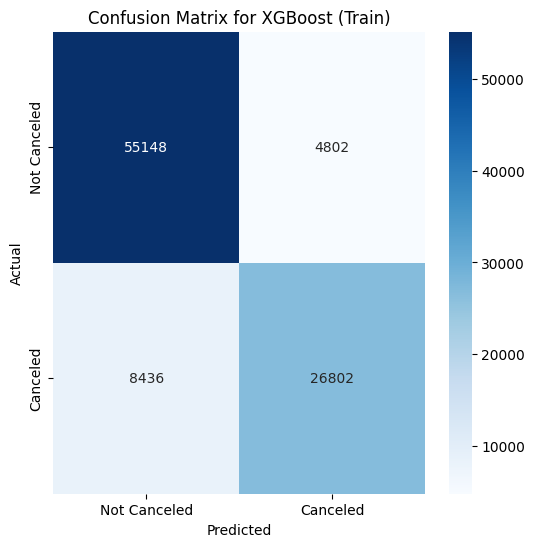

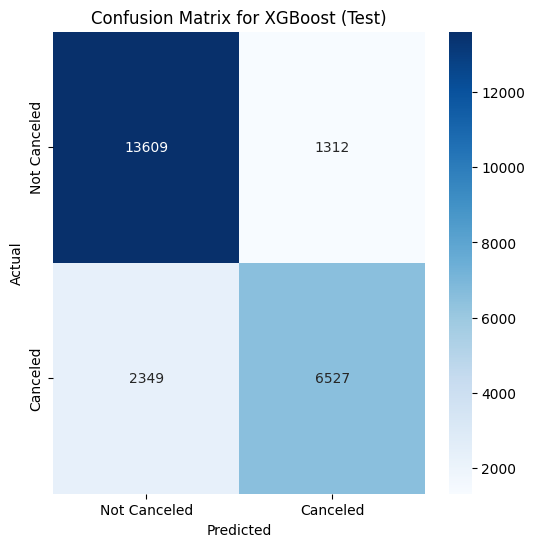

In [95]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Paramètres à tester pour RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 6, 10, 12],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0]
}

# Initialisation du modèle XGBoost
xgb = XGBClassifier(random_state=42, use_label_encoder=False, n_jobs=-1)

# Recherche aléatoire des meilleurs hyperparamètres
random_search = RandomizedSearchCV(
    estimator=xgb, param_distributions=param_dist,
    n_iter=10, cv=3, verbose=2, random_state=42,
    n_jobs=-1, scoring='accuracy'
)

# Entraînement avec RandomizedSearchCV
random_search.fit(X_train, y_train)

# Meilleurs paramètres trouvés
print("\nMeilleurs paramètres trouvés :")
print(random_search.best_params_)

# Meilleur modèle trouvé
best_xgb = random_search.best_estimator_

# Validation croisée (score moyen de validation)
cv_scores = cross_val_score(best_xgb, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
print(f"\nMean CV Accuracy: {cv_scores.mean():.4f}")

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train_best = best_xgb.predict(X_train)
y_pred_test_best = best_xgb.predict(X_test)

# Évaluation des performances
accuracy_train_best = accuracy_score(y_train, y_pred_train_best)
accuracy_test_best = accuracy_score(y_test, y_pred_test_best)

print(f"\nPerformance sur l'ensemble d'entraînement: {accuracy_train_best:.4f}")
print(f"Performance sur l'ensemble de test: {accuracy_test_best:.4f}")

# Rapport de classification
print("\nClassification Report (Entraînement):")
print(classification_report(y_train, y_pred_train_best))

print("\nClassification Report (Test):")
print(classification_report(y_test, y_pred_test_best))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train_best = confusion_matrix(y_train, y_pred_train_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for XGBoost (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test_best = confusion_matrix(y_test, y_pred_test_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for XGBoost (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">CatBoost Classifier</font></h3>

</div>


Fitting 3 folds for each of 10 candidates, totalling 30 fits

Meilleurs paramètres trouvés :
{'learning_rate': 0.1, 'l2_leaf_reg': 1, 'iterations': 100, 'depth': 8, 'border_count': 100}

Mean CV Accuracy: 0.8372

Performance sur l'ensemble d'entraînement: 0.8416
Performance sur l'ensemble de test: 0.8368

Classification Report (Entraînement):
              precision    recall  f1-score   support

           0       0.85      0.91      0.88     59950
           1       0.82      0.73      0.77     35238

    accuracy                           0.84     95188
   macro avg       0.84      0.82      0.83     95188
weighted avg       0.84      0.84      0.84     95188


Classification Report (Test):
              precision    recall  f1-score   support

           0       0.85      0.91      0.87     14921
           1       0.82      0.72      0.77      8876

    accuracy                           0.84     23797
   macro avg       0.83      0.81      0.82     23797
weighted avg       0.84  

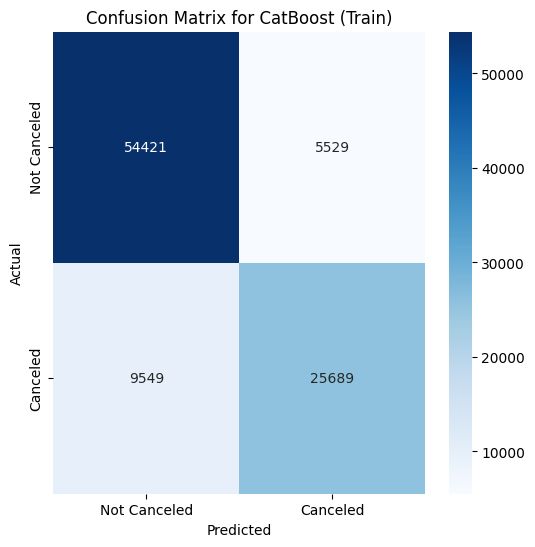

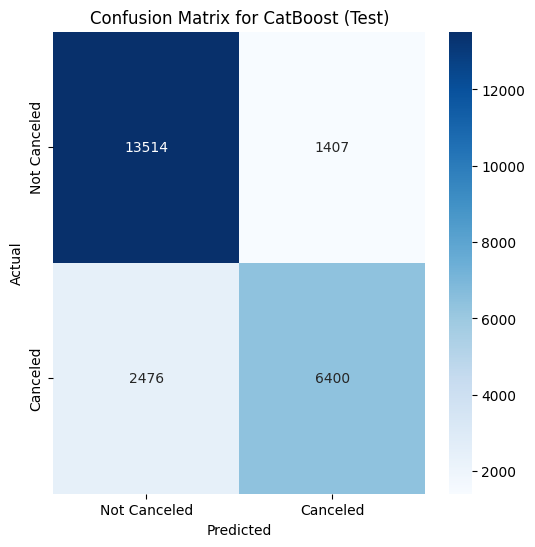

In [96]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
import seaborn as sns

# Paramètres à tester pour RandomizedSearchCV
param_dist = {
    'iterations': [50, 100, 200],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'l2_leaf_reg': [1, 3, 5, 10],
    'border_count': [32, 50, 100]
}

# Initialisation du modèle CatBoostClassifier
catboost = CatBoostClassifier(random_seed=42, verbose=0, thread_count=-1)

# Recherche aléatoire des meilleurs hyperparamètres
random_search = RandomizedSearchCV(
    estimator=catboost, param_distributions=param_dist,
    n_iter=10, cv=3, verbose=2, random_state=42,
    n_jobs=-1, scoring='accuracy'
)

# Entraînement avec RandomizedSearchCV
random_search.fit(X_train, y_train)

# Meilleurs paramètres trouvés
print("\nMeilleurs paramètres trouvés :")
print(random_search.best_params_)

# Meilleur modèle trouvé
best_catboost = random_search.best_estimator_

# Validation croisée (score moyen de validation)
cv_scores = cross_val_score(best_catboost, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
print(f"\nMean CV Accuracy: {cv_scores.mean():.4f}")

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train_best = best_catboost.predict(X_train)
y_pred_test_best = best_catboost.predict(X_test)

# Évaluation des performances
accuracy_train_best = accuracy_score(y_train, y_pred_train_best)
accuracy_test_best = accuracy_score(y_test, y_pred_test_best)

print(f"\nPerformance sur l'ensemble d'entraînement: {accuracy_train_best:.4f}")
print(f"Performance sur l'ensemble de test: {accuracy_test_best:.4f}")

# Rapport de classification
print("\nClassification Report (Entraînement):")
print(classification_report(y_train, y_pred_train_best))

print("\nClassification Report (Test):")
print(classification_report(y_test, y_pred_test_best))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train_best = confusion_matrix(y_train, y_pred_train_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for CatBoost (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test_best = confusion_matrix(y_test, y_pred_test_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for CatBoost (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">LGBM</font></h3>

</div>


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Info] Number of positive: 35238, number of negative: 59950
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 95188, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370194 -> initscore=-0.531386
[LightGBM] [Info] Start training from score -0.531386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

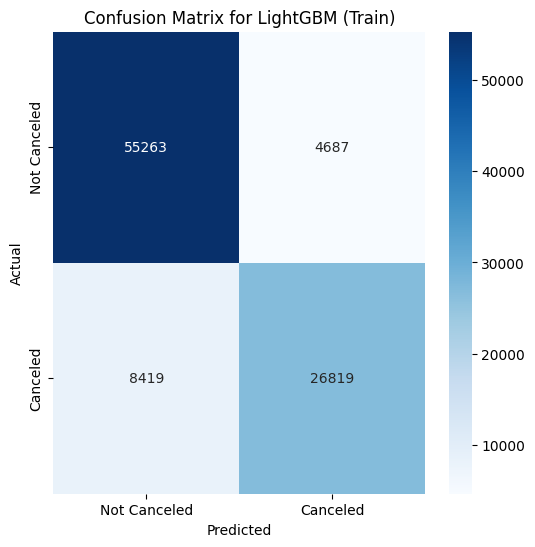

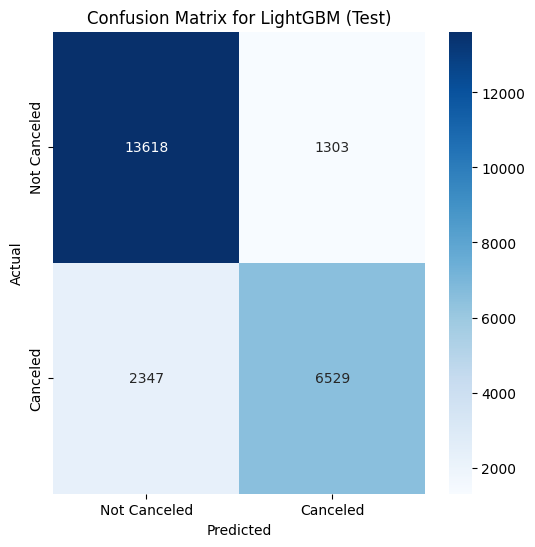

In [97]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.pyplot as plt
import seaborn as sns

# Paramètres à tester pour RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8, 10],
    'num_leaves': [31, 50, 100],
    'min_child_samples': [20, 30, 50],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Initialisation du modèle LightGBM
lgbm = lgb.LGBMClassifier(random_state=42)

# Recherche aléatoire des meilleurs hyperparamètres
random_search = RandomizedSearchCV(
    estimator=lgbm, param_distributions=param_dist,
    n_iter=10, cv=3, verbose=2, random_state=42,
    n_jobs=-1, scoring='accuracy'
)

# Entraînement avec RandomizedSearchCV
random_search.fit(X_train, y_train)

# Meilleurs paramètres trouvés
print("\nMeilleurs paramètres trouvés :")
print(random_search.best_params_)

# Meilleur modèle trouvé
best_lgbm = random_search.best_estimator_

# Validation croisée (score moyen de validation)
cv_scores = cross_val_score(best_lgbm, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
print(f"\nMean CV Accuracy: {cv_scores.mean():.4f}")

# Prédictions sur les ensembles d'entraînement et de test
y_pred_train_best = best_lgbm.predict(X_train)
y_pred_test_best = best_lgbm.predict(X_test)

# Évaluation des performances
accuracy_train_best = accuracy_score(y_train, y_pred_train_best)
accuracy_test_best = accuracy_score(y_test, y_pred_test_best)

print(f"\nPerformance sur l'ensemble d'entraînement: {accuracy_train_best:.4f}")
print(f"Performance sur l'ensemble de test: {accuracy_test_best:.4f}")

# Rapport de classification
print("\nClassification Report (Entraînement):")
print(classification_report(y_train, y_pred_train_best))

print("\nClassification Report (Test):")
print(classification_report(y_test, y_pred_test_best))

# Matrice de confusion pour l'ensemble d'entraînement
cm_train_best = confusion_matrix(y_train, y_pred_train_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_train_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for LightGBM (Train)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Matrice de confusion pour l'ensemble de test
cm_test_best = confusion_matrix(y_test, y_pred_test_best)
plt.figure(figsize=(6,6))
sns.heatmap(cm_test_best, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Canceled', 'Canceled'], yticklabels=['Not Canceled', 'Canceled'])
plt.title('Confusion Matrix for LightGBM (Test)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Deployement</font></h3>

</div>


In [99]:
import joblib 
joblib.dump(best_lgbm, 'lightgbm_best_model.pkl')

['lightgbm_best_model.pkl']

<p style="font-size: 42px; color: #ffffff; font-family: 'Arial, Helvetica, sans-serif'; text-align: center; background-color: #004d73; border-radius: 8px; padding: 10px;">
<strong>Comparison After Hyperparameter Tuning<strong>
</p>


[LightGBM] [Info] Number of positive: 28190, number of negative: 47960
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 76150, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370190 -> initscore=-0.531400
[LightGBM] [Info] Start training from score -0.531400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

,Model,CV Accuracy,CV Precision,CV Recall
3,XGBoost,0.845695,0.826759,0.737783
5,LightGBM,0.845579,0.826114,0.738265
2,Random Forest,0.839927,0.814633,0.734832
4,CatBoost,0.837522,0.816088,0.724360
1,Decision Tree,0.800164,0.714646,0.766076
0,Logistic Regression,0.795836,0.807490,0.588938


,Model,Train Accuracy,Test Accuracy,Train Recall,Test Recall,Train Precision,Test Precision,Train F1-Score,Test F1-Score,AUC
5,LightGBM,0.862315,0.846619,0.862315,0.846619,0.861665,0.845770,0.860543,0.844420,0.920142
3,XGBoost,0.860928,0.846157,0.860928,0.846157,0.860192,0.845278,0.859193,0.843968,0.920142
2,Random Forest,0.913519,0.840190,0.913519,0.840190,0.913783,0.838977,0.912647,0.838150,0.911821
4,CatBoost,0.841598,0.836828,0.841598,0.836828,0.840422,0.835688,0.839376,0.834422,0.911400
1,Decision Tree,0.800500,0.800647,0.800500,0.800647,0.804241,0.803697,0.801801,0.801753,0.870842
0,Logistic Regression,0.795899,0.794260,0.795899,0.794260,0.797611,0.796138,0.787373,0.785787,0.867723


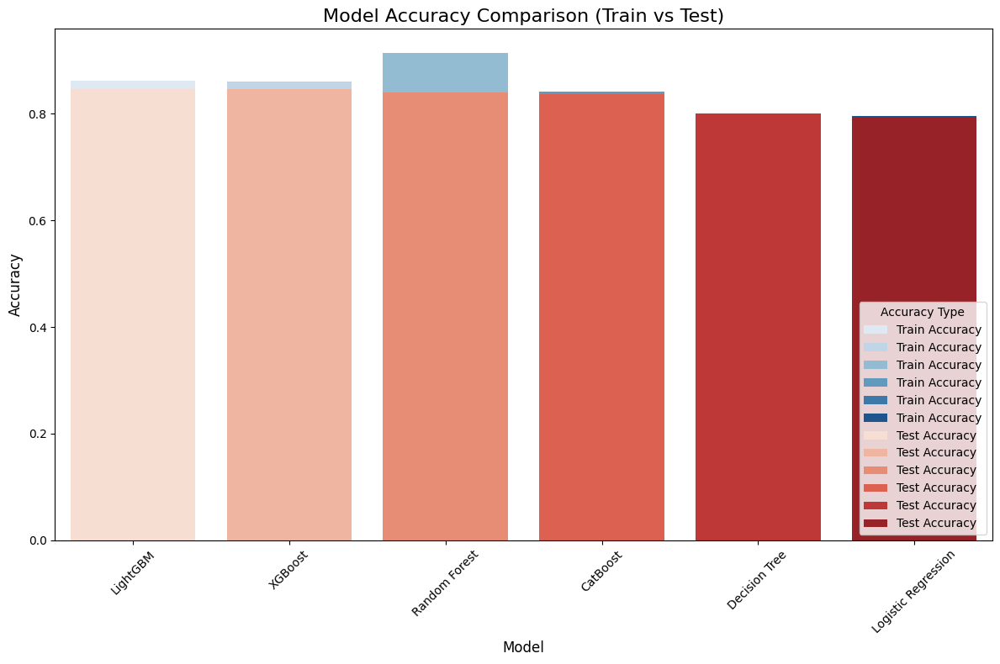

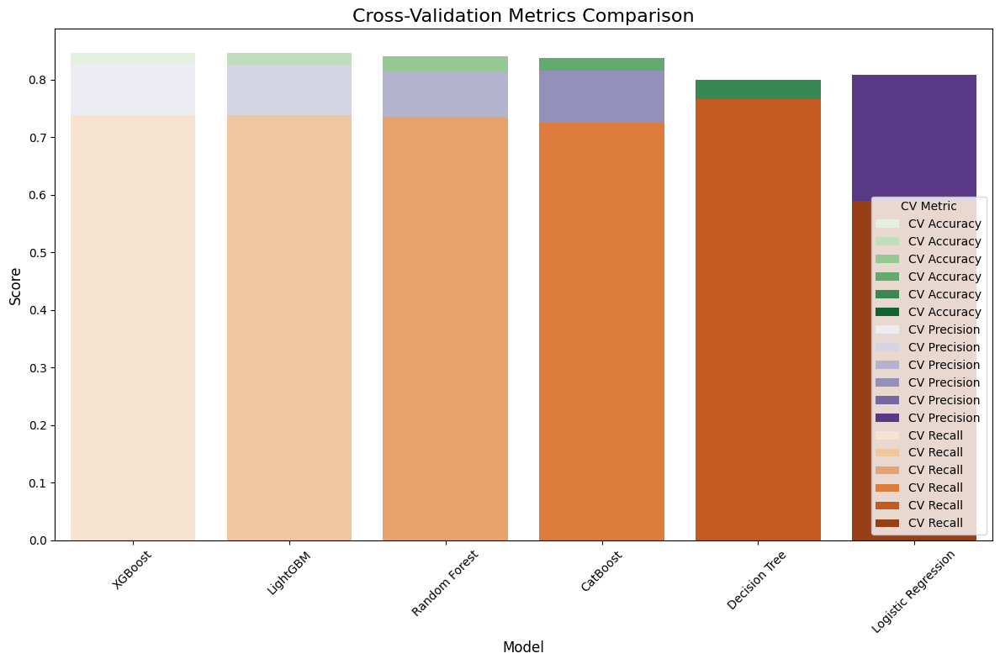

In [101]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score
from sklearn.model_selection import cross_val_score

# Fonction pour obtenir les métriques sous forme de dictionnaire
def get_classification_metrics(y_true, y_pred):
    report = classification_report(y_true, y_pred, output_dict=True)
    return {
        'precision': report['weighted avg']['precision'],
        'recall': report['weighted avg']['recall'],
        'f1_score': report['weighted avg']['f1-score'],
        'accuracy': accuracy_score(y_true, y_pred)
    }

# Dictionnaire des modèles déjà entraînés
models = {
    'Logistic Regression': logreg,
    'Decision Tree': dt,
    'Random Forest': best_rf,
    'XGBoost': best_xgb,
    'CatBoost': best_catboost,
    'LightGBM': best_lgbm
}

# Création de DataFrames vides pour stocker les résultats
cv_metrics_df = pd.DataFrame(columns=['Model', 'CV Accuracy', 'CV Precision', 'CV Recall'])
metrics_df = pd.DataFrame(columns=['Model', 'Train Accuracy', 'Test Accuracy', 'Train Recall', 'Test Recall', 
                                   'Train Precision', 'Test Precision', 'Train F1-Score', 'Test F1-Score', 'AUC'])

# Calcul des métriques pour chaque modèle
for model_name, model in models.items():
    # Obtenir les probabilités prédites
    if hasattr(model, "predict_proba"):  # Vérifie si le modèle supporte `predict_proba`
        y_pred_train_prob = model.predict_proba(X_train)[:, 1]
        y_pred_test_prob = model.predict_proba(X_test)[:, 1]
    elif hasattr(model, "decision_function"):  # Pour les modèles comme SVM avec `decision_function`
        y_pred_train_prob = model.decision_function(X_train)
        y_pred_test_prob = model.decision_function(X_test)
    else:
        raise ValueError(f"Le modèle {model_name} ne supporte ni `predict_proba` ni `decision_function`.")

    # Prédictions finales
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Calcul des métriques pour l'ensemble d'entraînement et de test
    train_metrics = get_classification_metrics(y_train, y_pred_train)
    test_metrics = get_classification_metrics(y_test, y_pred_test)
    auc_score = roc_auc_score(y_test, y_pred_test_prob)

    # Validation croisée pour l'accuracy
    cv_accuracy = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy').mean()
    cv_precision = cross_val_score(model, X_train, y_train, cv=5, scoring='precision').mean()
    cv_recall = cross_val_score(model, X_train, y_train, cv=5, scoring='recall').mean()
    
    # Créer un DataFrame temporaire pour les résultats de validation croisée
    temp_cv_metrics_df = pd.DataFrame({
        'Model': [model_name],
        'CV Accuracy': [cv_accuracy],
        'CV Precision': [cv_precision],
        'CV Recall': [cv_recall]
    })
    cv_metrics_df = pd.concat([cv_metrics_df, temp_cv_metrics_df], ignore_index=True)
    
    # Créer un DataFrame temporaire pour les résultats d'entraînement et de test
    temp_metrics_df = pd.DataFrame({
        'Model': [model_name],
        'Train Accuracy': [train_metrics['accuracy']],
        'Test Accuracy': [test_metrics['accuracy']],
        'Train Recall': [train_metrics['recall']],
        'Test Recall': [test_metrics['recall']],
        'Train Precision': [train_metrics['precision']],
        'Test Precision': [test_metrics['precision']],
        'Train F1-Score': [train_metrics['f1_score']],
        'Test F1-Score': [test_metrics['f1_score']],
        'AUC': [auc_score]
    })
    metrics_df = pd.concat([metrics_df, temp_metrics_df], ignore_index=True)

# Trier les DataFrames par ordre décroissant de Test Accuracy pour metrics_df et par ordre décroissant de CV Accuracy pour cv_metrics_df
metrics_df = metrics_df.sort_values(by='Test Accuracy', ascending=False)
cv_metrics_df = cv_metrics_df.sort_values(by='CV Accuracy', ascending=False)

# Affichage des résultats
from IPython.display import display

# Affichage du tableau pour la validation croisée
display(cv_metrics_df)

# Affichage du tableau pour les métriques d'entraînement et de test
display(metrics_df)


# Visualisation des résultats pour l'Accuracy
plt.figure(figsize=(12, 8))

# Graphique des barres de performance pour l'Accuracy
sns.barplot(x='Model', y='Train Accuracy', data=metrics_df, palette='Blues', ci=None, label='Train Accuracy')
sns.barplot(x='Model', y='Test Accuracy', data=metrics_df, palette='Reds', ci=None, label='Test Accuracy')

# Ajouter les titres et les labels
plt.title('Model Accuracy Comparison (Train vs Test)', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Accuracy Type", loc='lower right')

# Affichage du graphique
plt.tight_layout()
plt.show()

# Visualisation des résultats pour la Validation Croisée
plt.figure(figsize=(12, 8))

# Graphique des barres de performance pour la validation croisée
sns.barplot(x='Model', y='CV Accuracy', data=cv_metrics_df, palette='Greens', ci=None, label='CV Accuracy')
sns.barplot(x='Model', y='CV Precision', data=cv_metrics_df, palette='Purples', ci=None, label='CV Precision')
sns.barplot(x='Model', y='CV Recall', data=cv_metrics_df, palette='Oranges', ci=None, label='CV Recall')

# Ajouter les titres et les labels
plt.title('Cross-Validation Metrics Comparison', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="CV Metric", loc='lower right')

# Affichage du graphique
plt.tight_layout()
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #e6f0ff; font-size:120%; text-align:left">

<h3 align="left"><font color="darkblue">Conclusion</font></h3>

<p>Le meilleur modèle testé est <b>LightGBM</b>, avec la meilleure précision après ajustement des hyperparamètres. Concernant le surajustement <i>(overfitting)</i>, seuls deux algorithmes ne présentent pas cette condition dans leur version de base :<b> Logistic Regression </b>et<b> Decision Tree</b>. <b>Random Forest</b> s’est également distingué par une précision élevée. L’<b>accuracy</b> a été utilisée comme métrique principale en raison de l’équilibre relatif des données (63 % de réservations confirmées et 37 % annulées).</p>

<p>Ce modèle aide les gestionnaires d’hôtels à identifier les réservations "potentiellement annulées", réduisant ainsi les pertes de revenus et facilitant la mise en œuvre de politiques d'annulation plus flexibles.</p>

<h3 align="left"><font color="darkblue">Limites et Recherches Futures</font></h3>

<h4><b>Limites</b></h4>
<ul>
  <li>Le modèle de machine learning présenté dans ce notebook repose sur des données provenant d'hôtels City & Resort au Portugal, ce qui soulève certaines questions qui pourraient être explorées lors de futures recherches :</li>
  <li><b>Est-ce que des résultats similaires peuvent être obtenus avec des hôtels situés en dehors du Portugal ?</b></li>
  <li><b>Le modèle aurait-il de meilleurs résultats si plus d'hôtels étaient intégrés dans le modèle de machine learning ?</b></li>
  <li><b>Les résultats sont-ils spécifiques au type d'hôtels intégrés dans ce modèle ?</b></li>
</ul>

<h4><b>Recherches Futures</b></h4>
<ul>
  <li>Étendre les données à d'autres régions et types d'hôtels.</li>
  <li>Intégrer des facteurs comme la météo et les avis clients.</li>
  <li>Tester le modèle dans un contexte post-pandémique.</li>
  <li>Affiner les prédictions avec de nouvelles techniques et données.</li>
</ul>

<p>Ces pistes visent à améliorer la généralisation et l’efficacité des prédictions pour une gestion hôtelière optimisée.</p>

</div>
